In [1]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import layers, losses
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.layers import Dense, Conv2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display

### Load and prepare the dataset


In [2]:
imgres = 64
BATCH_SIZE = 64

datagen = ImageDataGenerator(preprocessing_function = lambda x: (x-255/2)/(255/2))
train_dataset = datagen.flow_from_directory('cats_{}x{}_grayscale/all'.format(imgres, imgres),
        class_mode=None, batch_size=BATCH_SIZE, shuffle=True,
        target_size=(imgres, imgres), color_mode="grayscale")


Found 15747 images belonging to 1 classes.


## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size of 28x28x1. Notice the `tf.keras.layers.LeakyReLU` activation for each layer, except the output layer which uses tanh.

In [3]:
dim = 100

def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(32*(imgres//4)**2, use_bias=False, input_shape=(dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((imgres//4, imgres//4, 32)))
    model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

Use the (as yet untrained) generator to create an image.

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8192)              819200    
_________________________________________________________________
batch_normalization (BatchNo (None, 8192)              32768     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 8192)              0         
_________________________________________________________________
reshape (Reshape)            (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 32, 32, 32)        25600     
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 32, 32)        128       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 32)        0

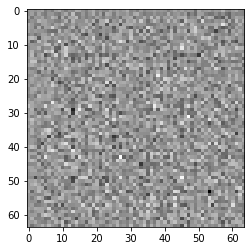

In [4]:
generator = make_generator_model()
print(generator.summary())

noise = tf.random.normal([1, dim])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

### The Discriminator

The discriminator is a CNN-based image classifier.

In [5]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(32, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[imgres, imgres, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    return model

Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [6]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00128415]], shape=(1, 1), dtype=float32)


## Define the loss and optimizers

Define loss functions and optimizers for both models.


In [7]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [8]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [9]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since you will train two networks separately.

In [10]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [11]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Define the training loop


In [12]:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [13]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss, disc_loss

In [14]:
def train(dataset, epochs):
    epoch = 0
    batch = 0
    batches_per_epoch = len(dataset)
    start = time.time()
    all_gen_loss = []
    all_disc_loss = []
    while epoch < epochs:
        image_batch = dataset.next()
        gen_loss, disc_loss = train_step(image_batch)
        all_gen_loss.append(gen_loss)
        all_disc_loss.append(disc_loss)
        batch += 1
        if batch%20 == 0:
            print("Epoch {} batch {}".format(epoch, batch))
        if batch%batches_per_epoch == 0:
            plt.figure(figsize=(12, 6))
            xepoch = np.arange(len(all_gen_loss))/batches_per_epoch
            plt.plot(xepoch, all_gen_loss)
            plt.plot(xepoch, all_disc_loss)
            plt.xticks(np.arange(epoch+2))
            plt.xlabel("Epoch")
            plt.ylabel("Loss")
            plt.title("Losses")
            plt.legend(["Generator Loss", "Discriminator Loss"])
            plt.savefig("Losses{}.svg".format(epoch), facecolor='white')
            
            epoch += 1
            batch = 0
            generate_and_save_images(generator, epoch, seed)
            train_step(image_batch)
            # Save the model every 15 epochs
            if (epoch + 1) % 15 == 0:
                checkpoint.save(file_prefix = checkpoint_prefix)
            print ('Time for epoch {} is {} sec'.format(epoch, time.time()-start))
            start = time.time()
    return all_gen_loss, all_disc_loss

**Generate and save images**


In [15]:
def generate_and_save_images(model, epoch, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(20, 20))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray', vmin=0, vmax=255)
        plt.axis('off')

    plt.savefig('epoch{}.png'.format(epoch), facecolor='white')
    plt.show()

## Train the model


Epoch 0 batch 20
Epoch 0 batch 40
Epoch 0 batch 60
Epoch 0 batch 80
Epoch 0 batch 100
Epoch 0 batch 120
Epoch 0 batch 140
Epoch 0 batch 160
Epoch 0 batch 180
Epoch 0 batch 200
Epoch 0 batch 220
Epoch 0 batch 240


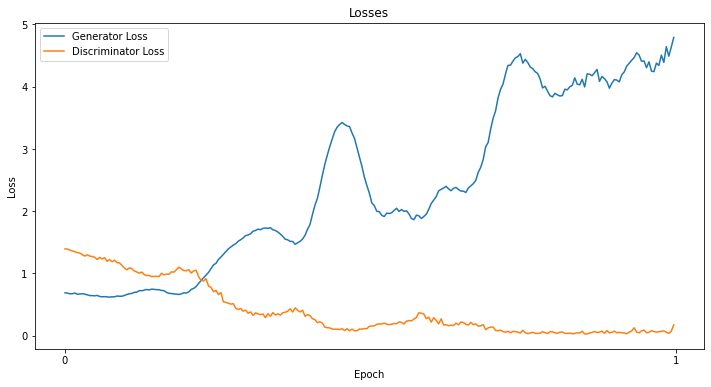

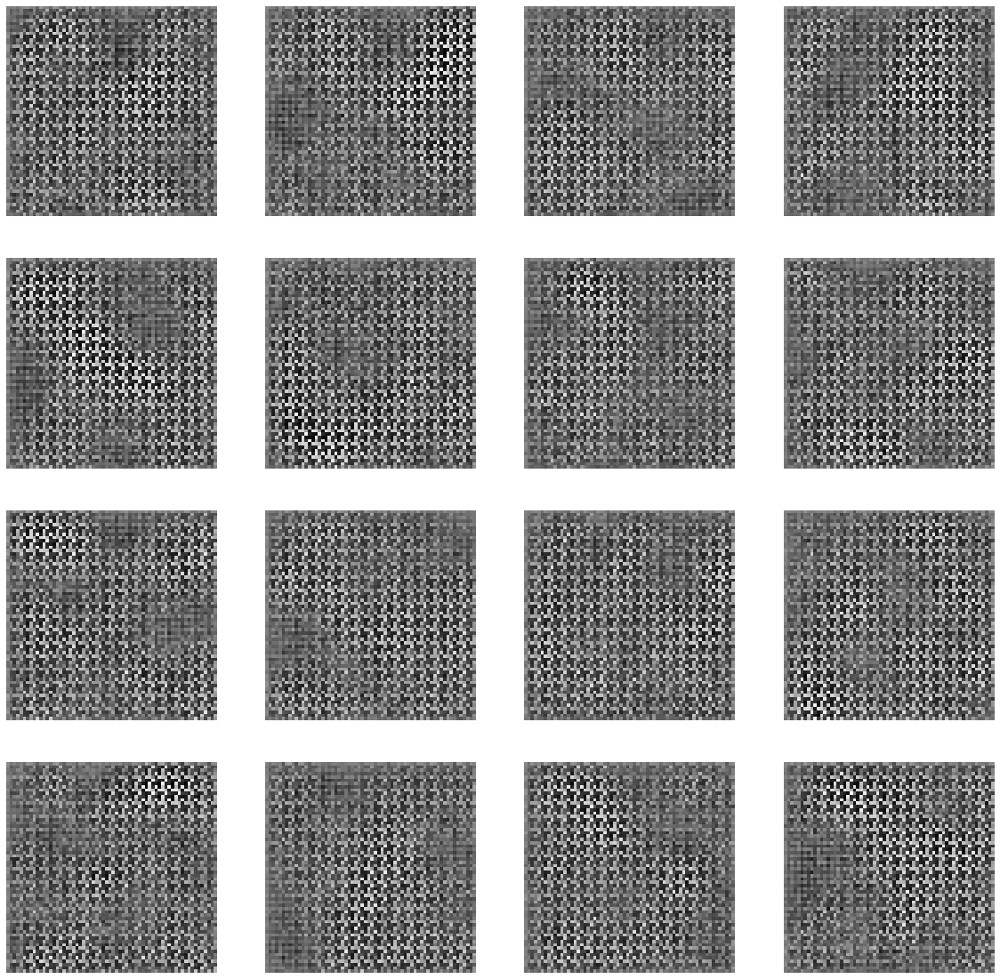

Time for epoch 1 is 50.69582796096802 sec
Epoch 1 batch 20
Epoch 1 batch 40
Epoch 1 batch 60
Epoch 1 batch 80
Epoch 1 batch 100
Epoch 1 batch 120
Epoch 1 batch 140
Epoch 1 batch 160
Epoch 1 batch 180
Epoch 1 batch 200
Epoch 1 batch 220
Epoch 1 batch 240


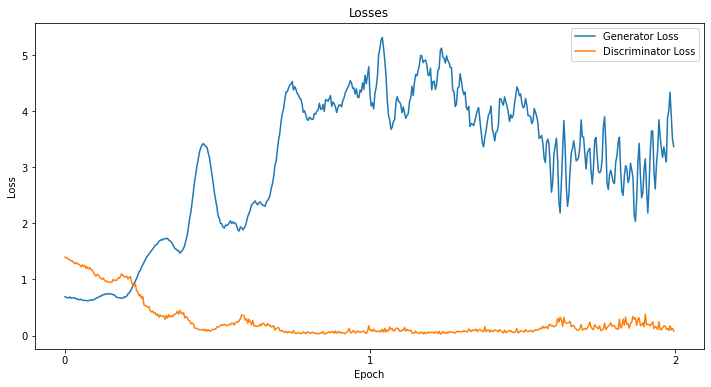

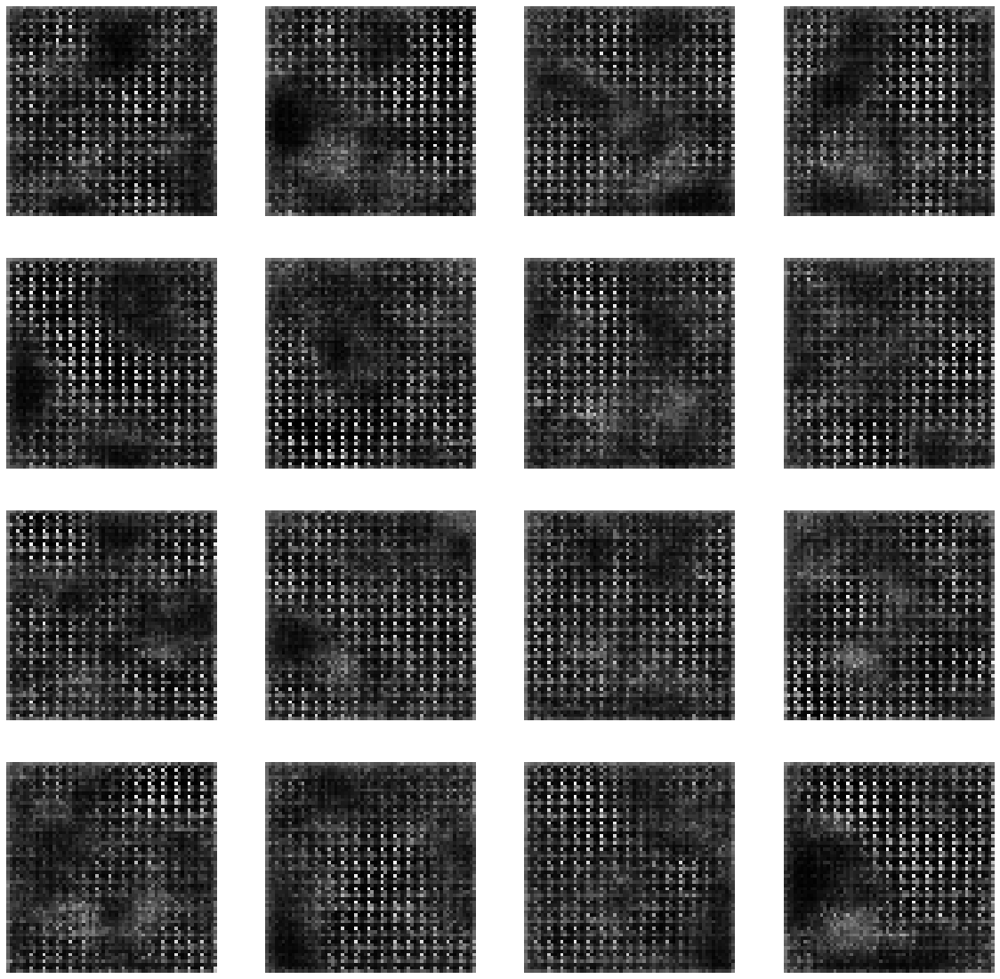

Time for epoch 2 is 48.27905011177063 sec
Epoch 2 batch 20
Epoch 2 batch 40
Epoch 2 batch 60
Epoch 2 batch 80
Epoch 2 batch 100
Epoch 2 batch 120
Epoch 2 batch 140
Epoch 2 batch 160
Epoch 2 batch 180
Epoch 2 batch 200
Epoch 2 batch 220
Epoch 2 batch 240


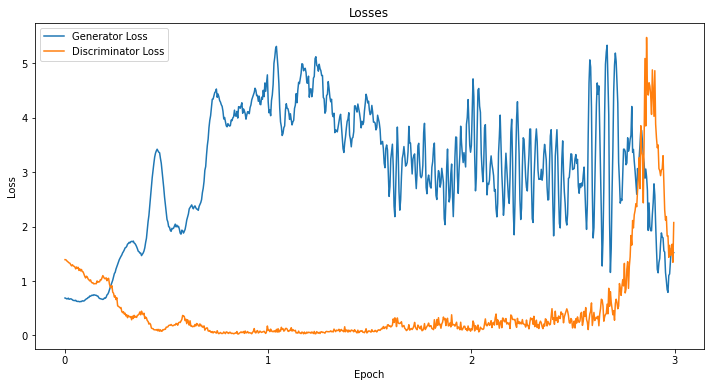

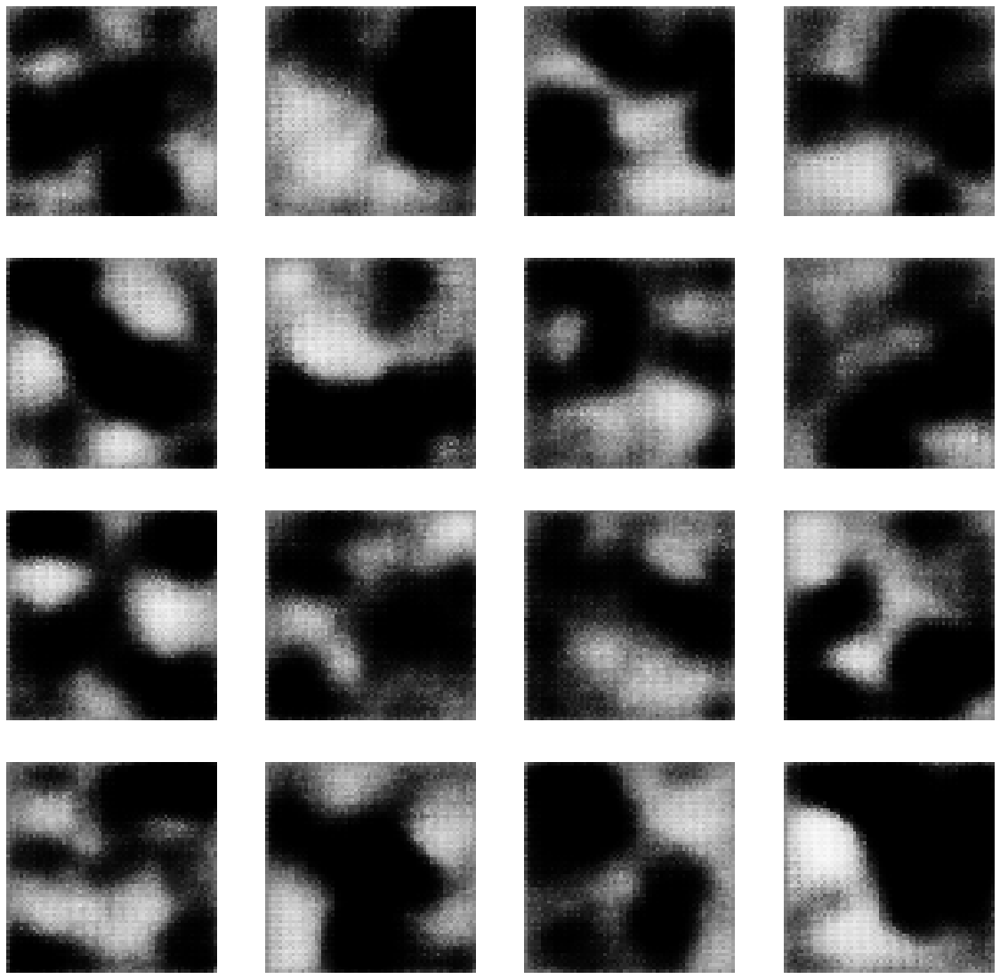

Time for epoch 3 is 48.341678619384766 sec
Epoch 3 batch 20
Epoch 3 batch 40
Epoch 3 batch 60
Epoch 3 batch 80
Epoch 3 batch 100
Epoch 3 batch 120
Epoch 3 batch 140
Epoch 3 batch 160
Epoch 3 batch 180
Epoch 3 batch 200
Epoch 3 batch 220
Epoch 3 batch 240


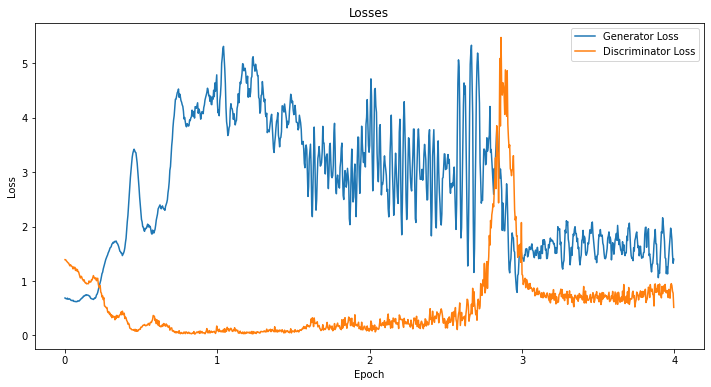

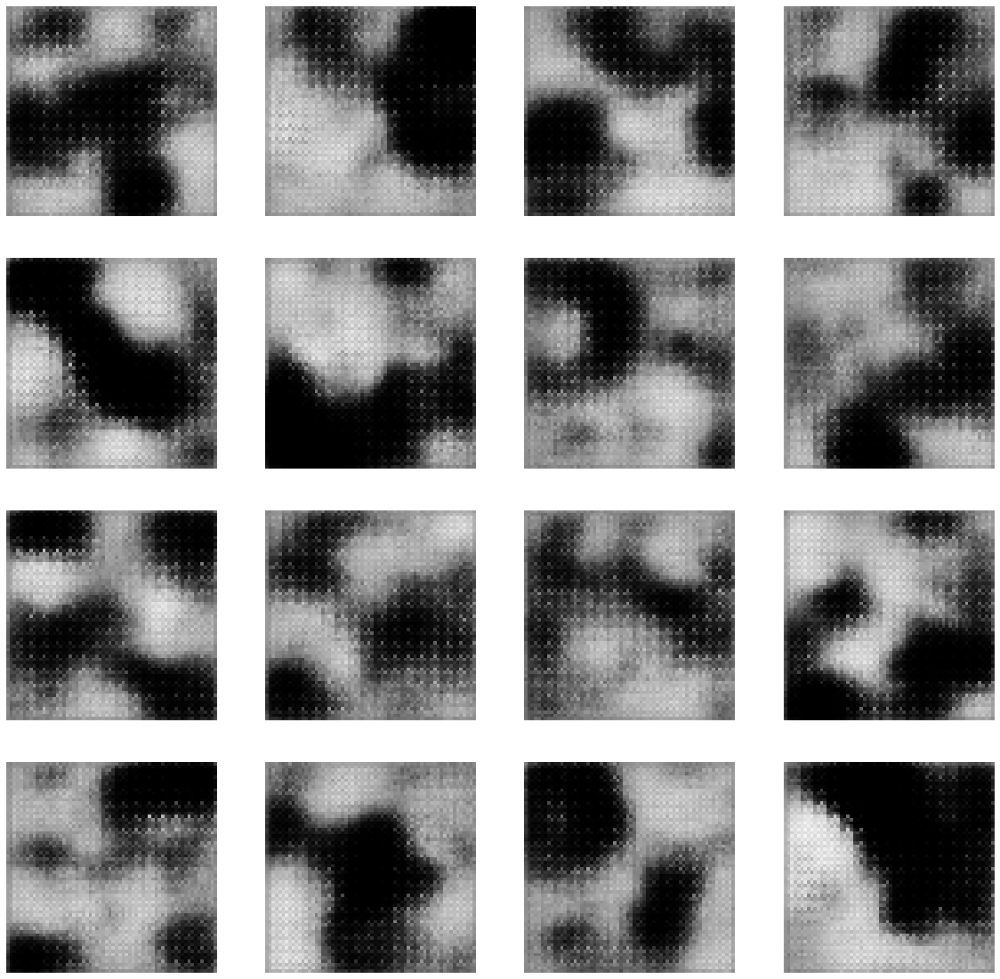

Time for epoch 4 is 47.547236919403076 sec
Epoch 4 batch 20
Epoch 4 batch 40
Epoch 4 batch 60
Epoch 4 batch 80
Epoch 4 batch 100
Epoch 4 batch 120
Epoch 4 batch 140
Epoch 4 batch 160
Epoch 4 batch 180
Epoch 4 batch 200
Epoch 4 batch 220
Epoch 4 batch 240


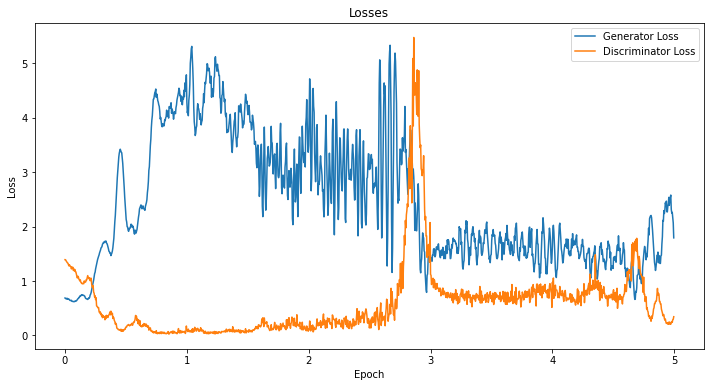

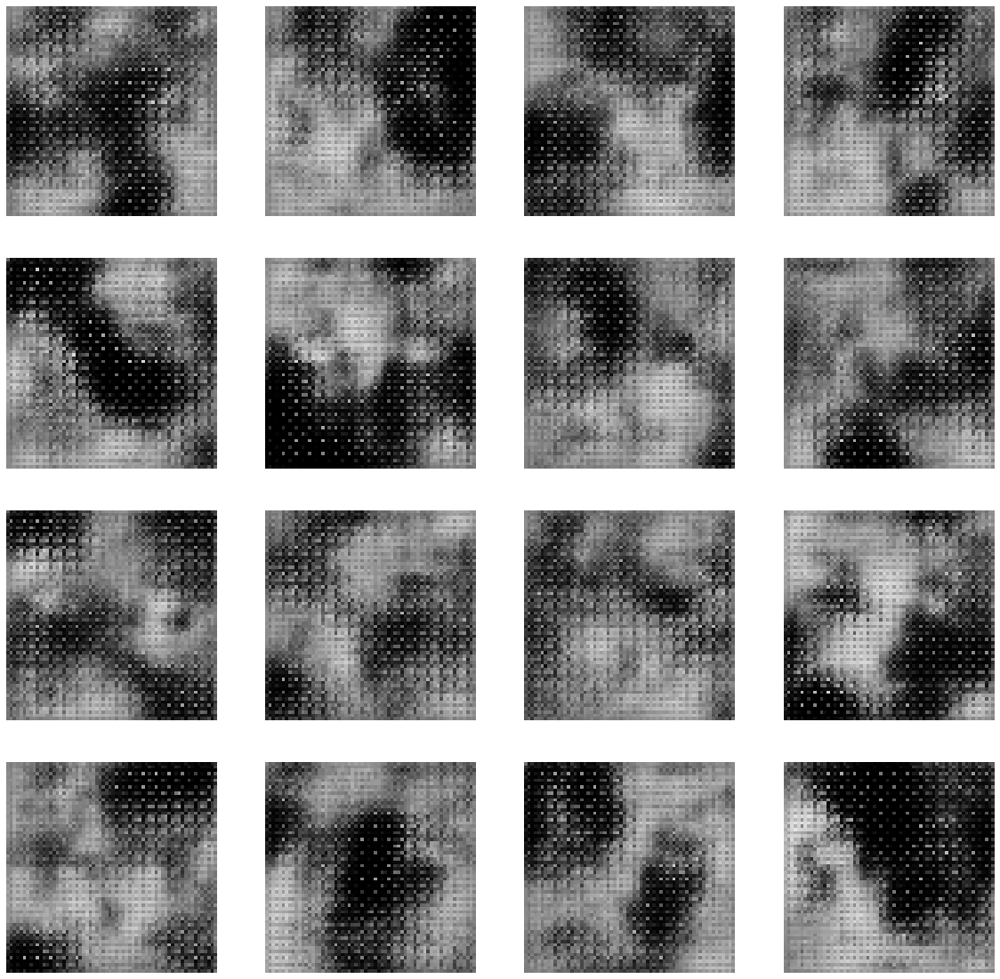

Time for epoch 5 is 48.042145013809204 sec
Epoch 5 batch 20
Epoch 5 batch 40
Epoch 5 batch 60
Epoch 5 batch 80
Epoch 5 batch 100
Epoch 5 batch 120
Epoch 5 batch 140
Epoch 5 batch 160
Epoch 5 batch 180
Epoch 5 batch 200
Epoch 5 batch 220
Epoch 5 batch 240


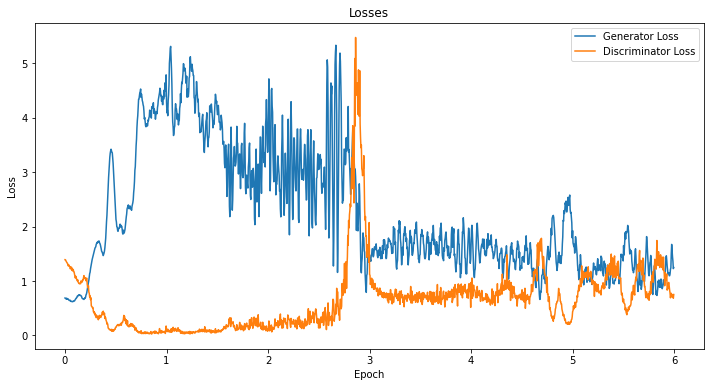

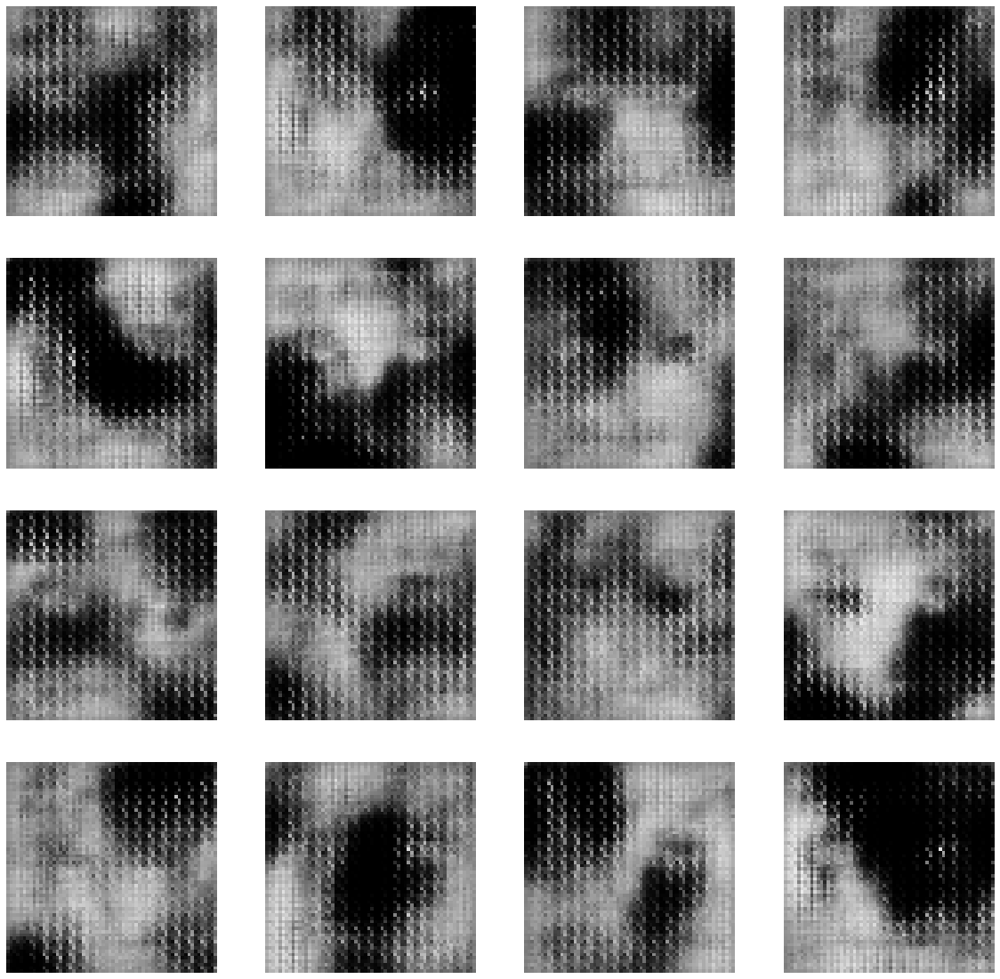

Time for epoch 6 is 47.89495253562927 sec
Epoch 6 batch 20
Epoch 6 batch 40
Epoch 6 batch 60
Epoch 6 batch 80
Epoch 6 batch 100
Epoch 6 batch 120
Epoch 6 batch 140
Epoch 6 batch 160
Epoch 6 batch 180
Epoch 6 batch 200
Epoch 6 batch 220
Epoch 6 batch 240


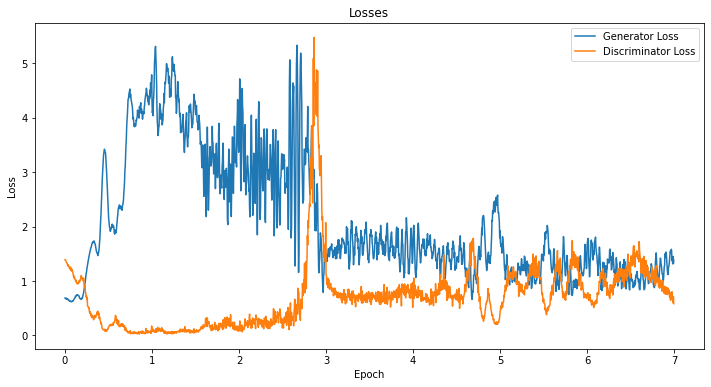

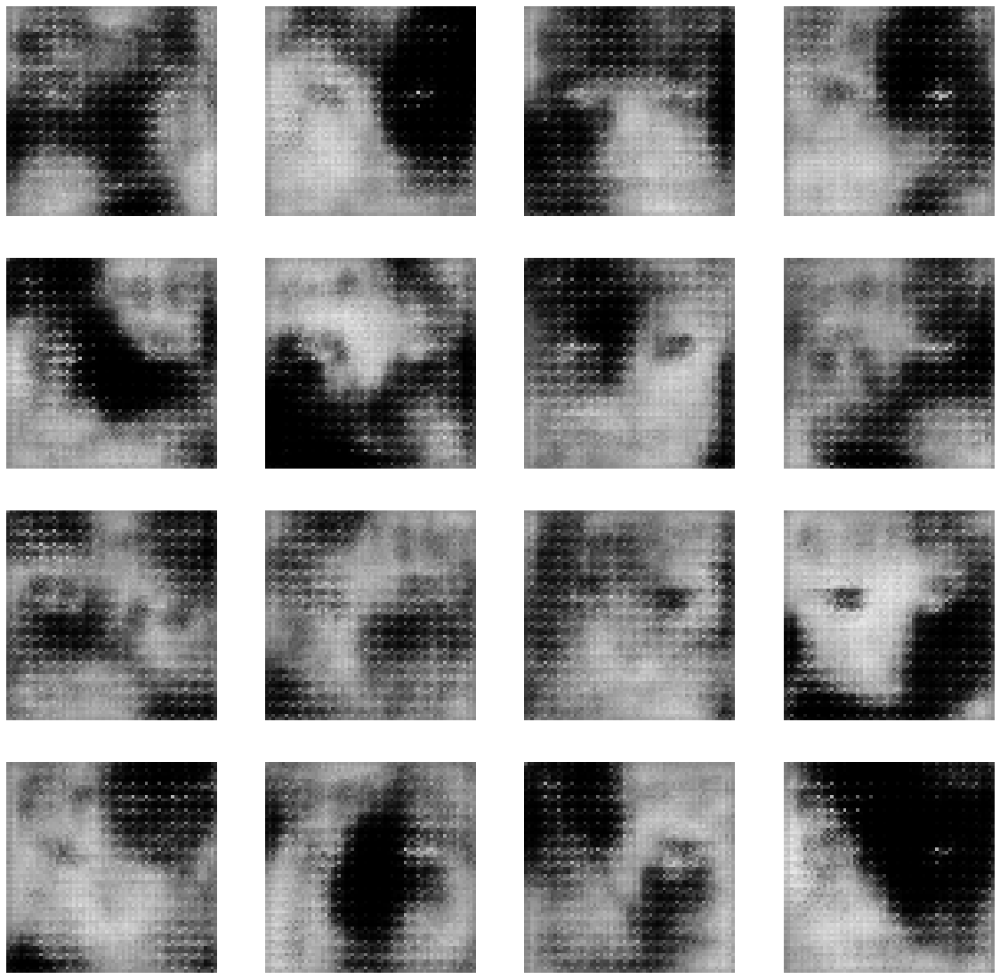

Time for epoch 7 is 47.69960856437683 sec
Epoch 7 batch 20
Epoch 7 batch 40
Epoch 7 batch 60
Epoch 7 batch 80
Epoch 7 batch 100
Epoch 7 batch 120
Epoch 7 batch 140
Epoch 7 batch 160
Epoch 7 batch 180
Epoch 7 batch 200
Epoch 7 batch 220
Epoch 7 batch 240


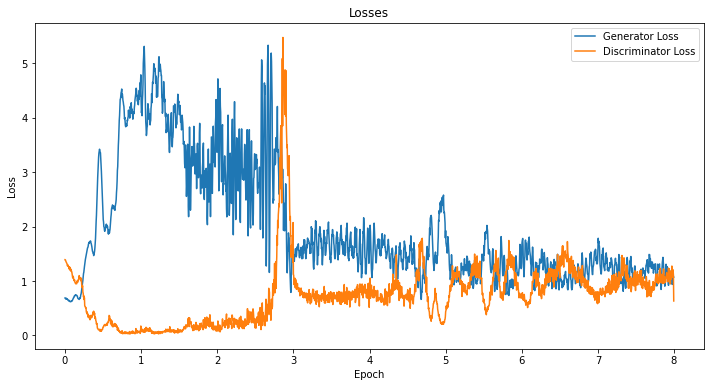

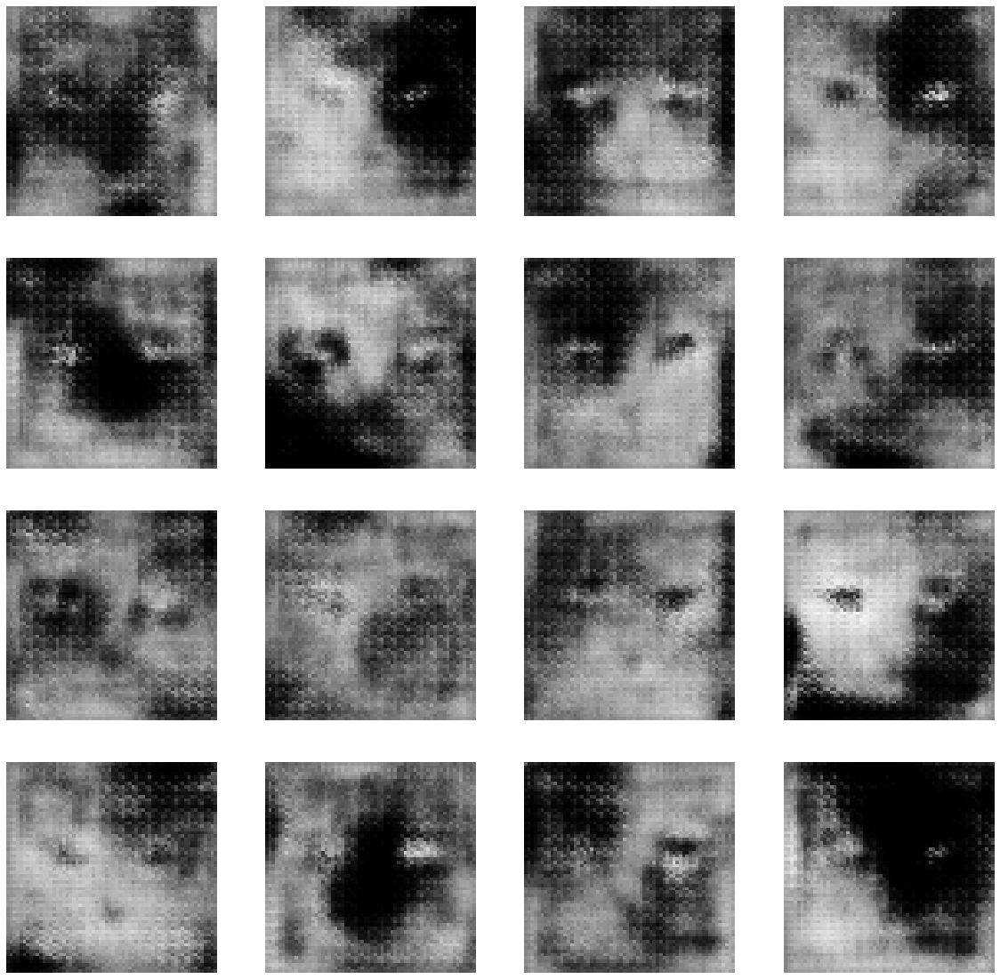

Time for epoch 8 is 47.01184821128845 sec
Epoch 8 batch 20
Epoch 8 batch 40
Epoch 8 batch 60
Epoch 8 batch 80
Epoch 8 batch 100
Epoch 8 batch 120
Epoch 8 batch 140
Epoch 8 batch 160
Epoch 8 batch 180
Epoch 8 batch 200
Epoch 8 batch 220
Epoch 8 batch 240


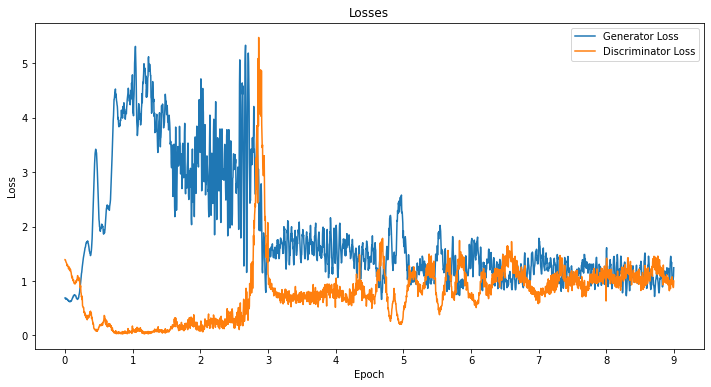

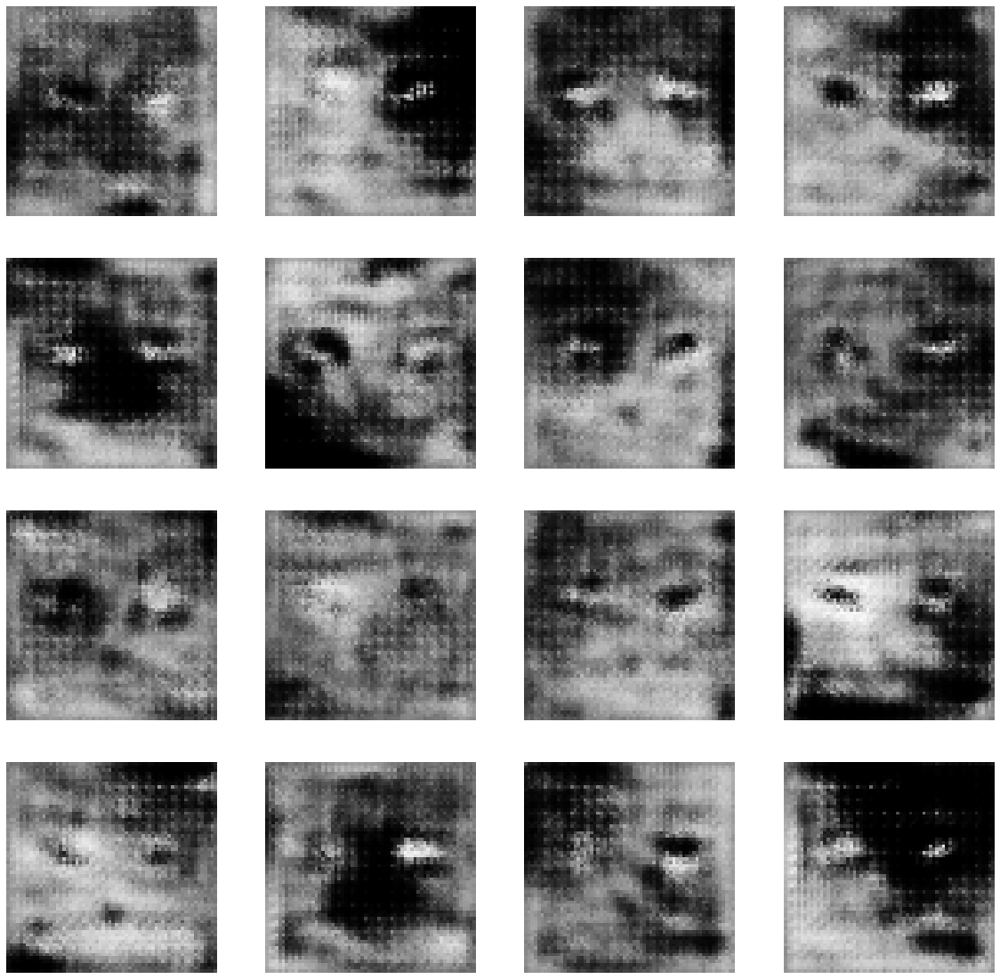

Time for epoch 9 is 48.505998849868774 sec
Epoch 9 batch 20
Epoch 9 batch 40
Epoch 9 batch 60
Epoch 9 batch 80
Epoch 9 batch 100
Epoch 9 batch 120
Epoch 9 batch 140
Epoch 9 batch 160
Epoch 9 batch 180
Epoch 9 batch 200
Epoch 9 batch 220
Epoch 9 batch 240


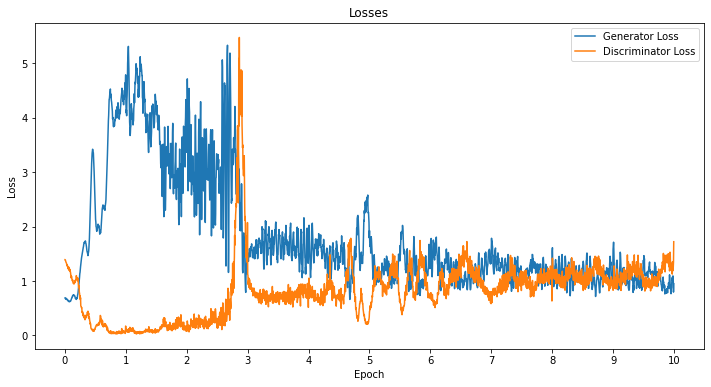

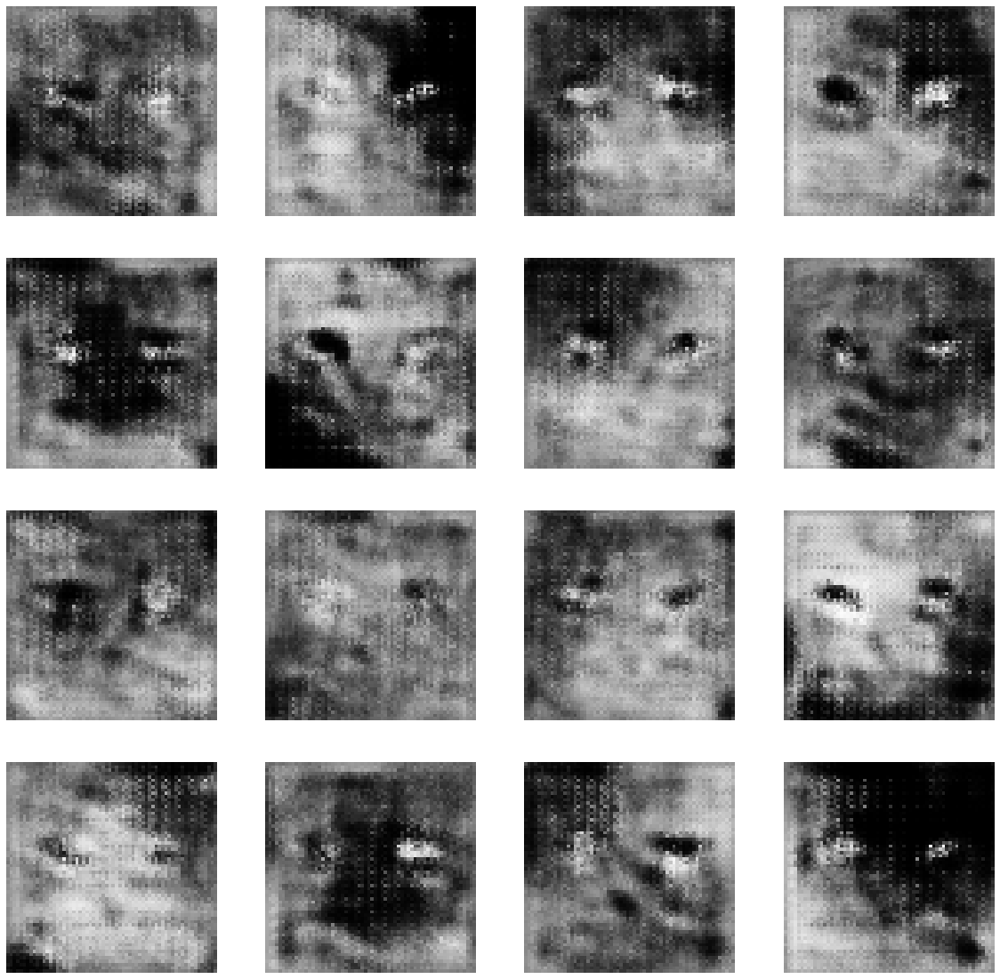

Time for epoch 10 is 46.72490406036377 sec
Epoch 10 batch 20
Epoch 10 batch 40
Epoch 10 batch 60
Epoch 10 batch 80
Epoch 10 batch 100
Epoch 10 batch 120
Epoch 10 batch 140
Epoch 10 batch 160
Epoch 10 batch 180
Epoch 10 batch 200
Epoch 10 batch 220
Epoch 10 batch 240


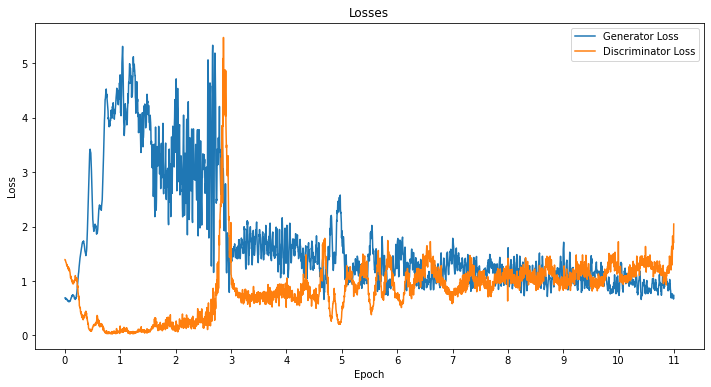

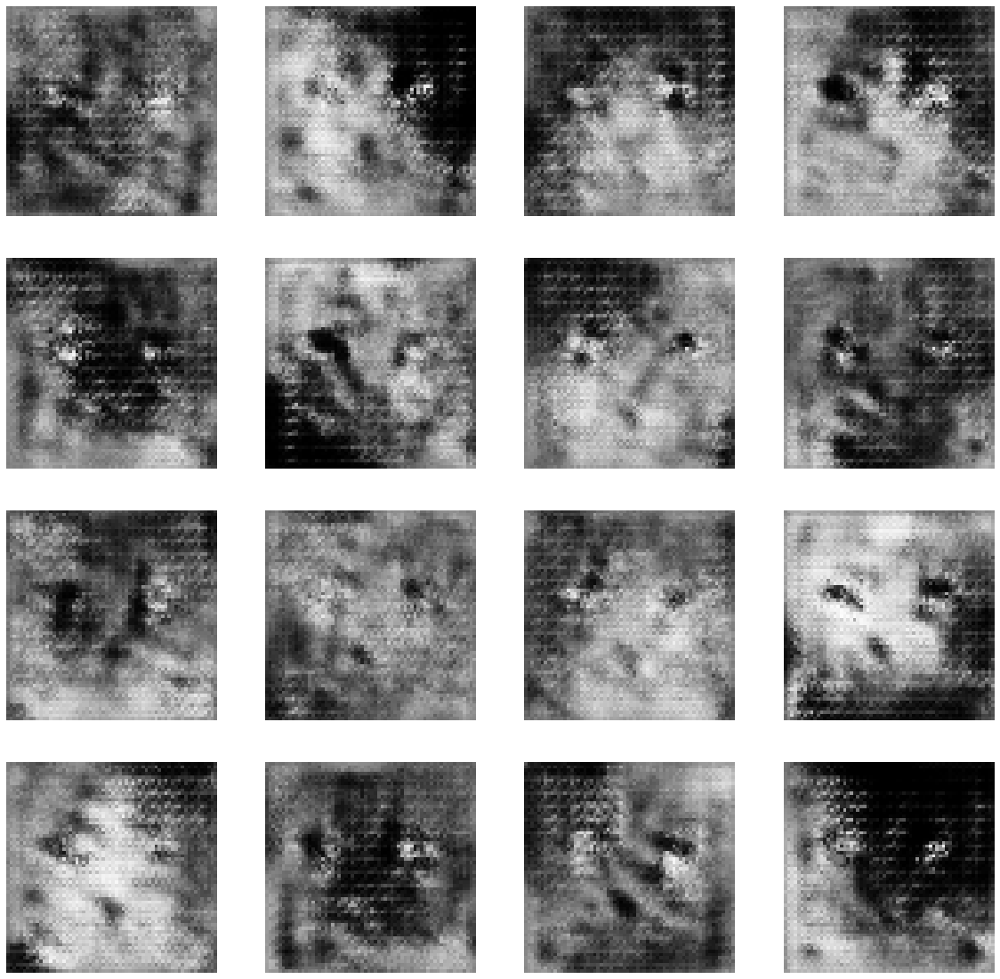

Time for epoch 11 is 46.46090745925903 sec
Epoch 11 batch 20
Epoch 11 batch 40
Epoch 11 batch 60
Epoch 11 batch 80
Epoch 11 batch 100
Epoch 11 batch 120
Epoch 11 batch 140
Epoch 11 batch 160
Epoch 11 batch 180
Epoch 11 batch 200
Epoch 11 batch 220
Epoch 11 batch 240


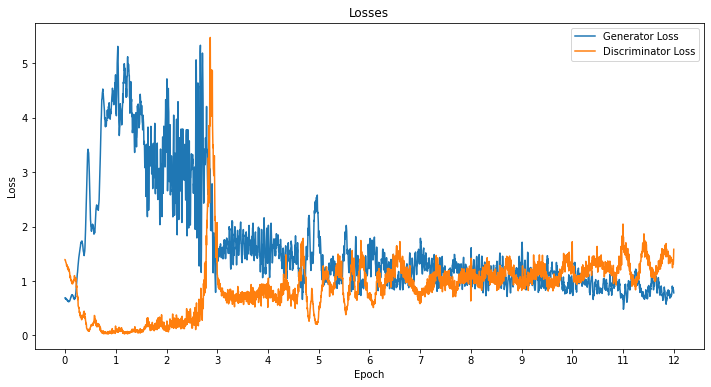

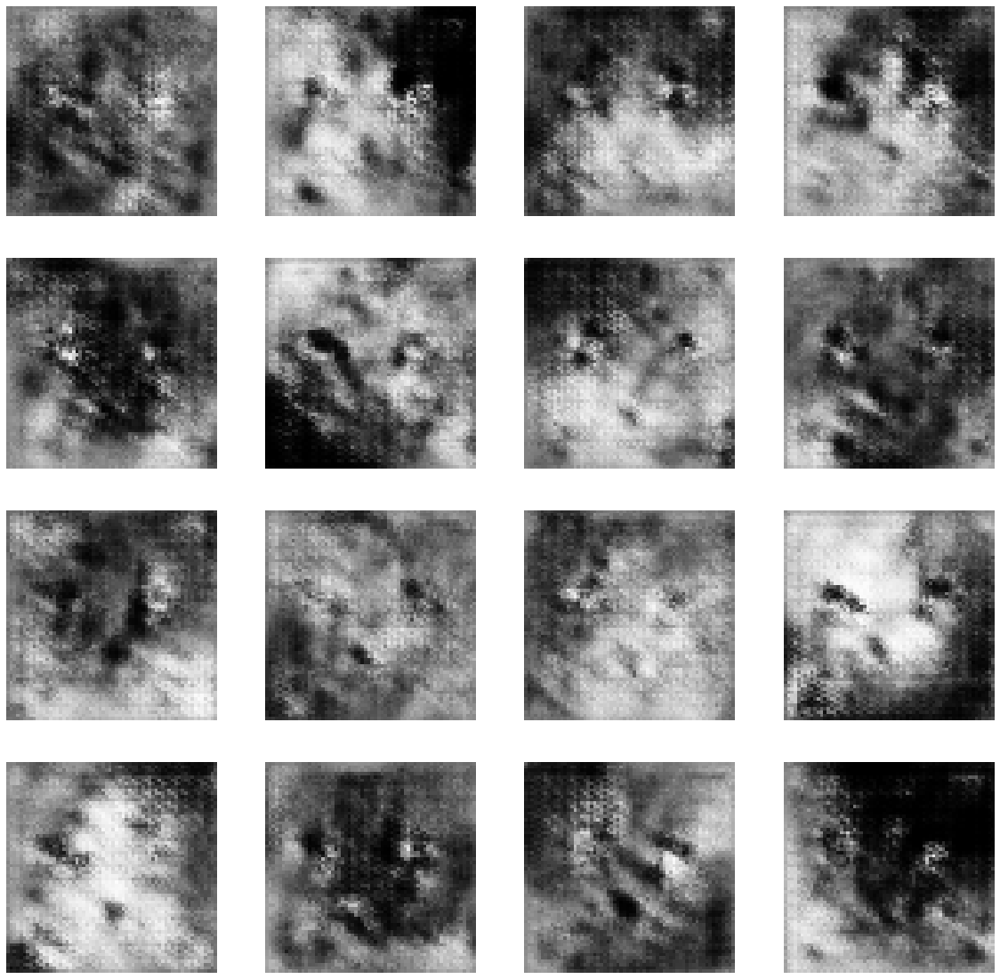

Time for epoch 12 is 45.91853189468384 sec
Epoch 12 batch 20
Epoch 12 batch 40
Epoch 12 batch 60
Epoch 12 batch 80
Epoch 12 batch 100
Epoch 12 batch 120
Epoch 12 batch 140
Epoch 12 batch 160
Epoch 12 batch 180
Epoch 12 batch 200
Epoch 12 batch 220
Epoch 12 batch 240


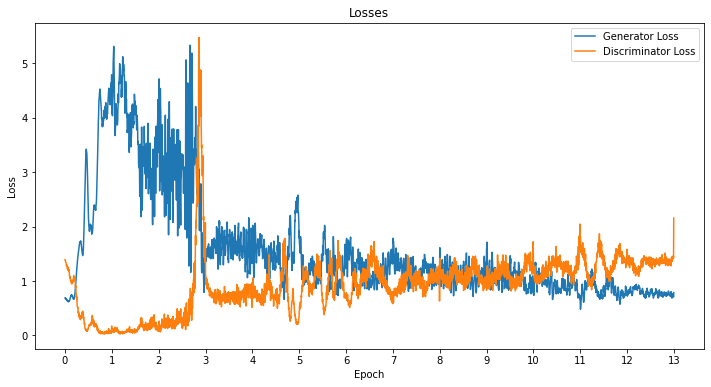

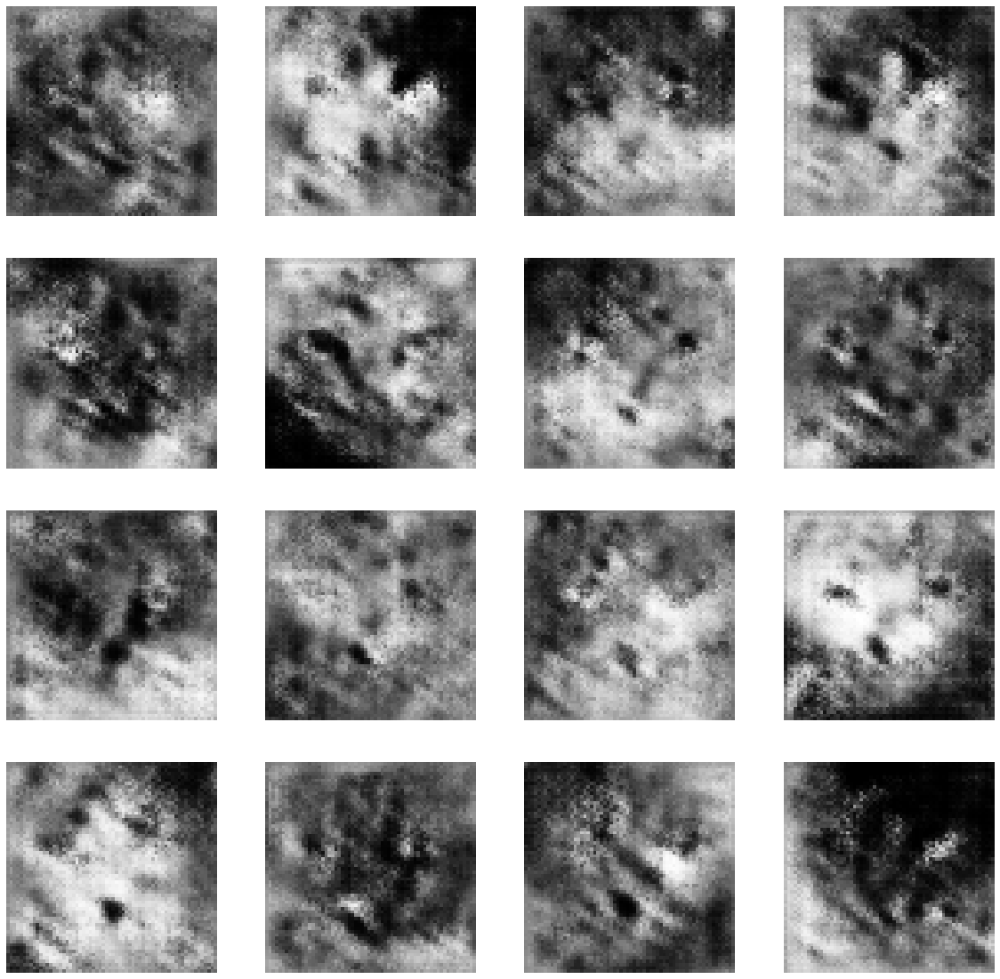

Time for epoch 13 is 45.834182024002075 sec
Epoch 13 batch 20
Epoch 13 batch 40
Epoch 13 batch 60
Epoch 13 batch 80
Epoch 13 batch 100
Epoch 13 batch 120
Epoch 13 batch 140
Epoch 13 batch 160
Epoch 13 batch 180
Epoch 13 batch 200
Epoch 13 batch 220
Epoch 13 batch 240


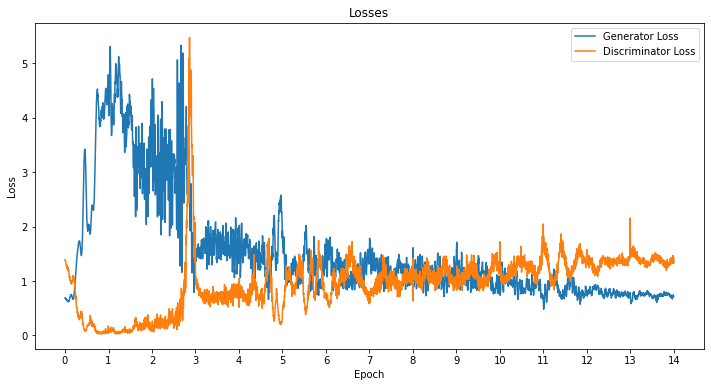

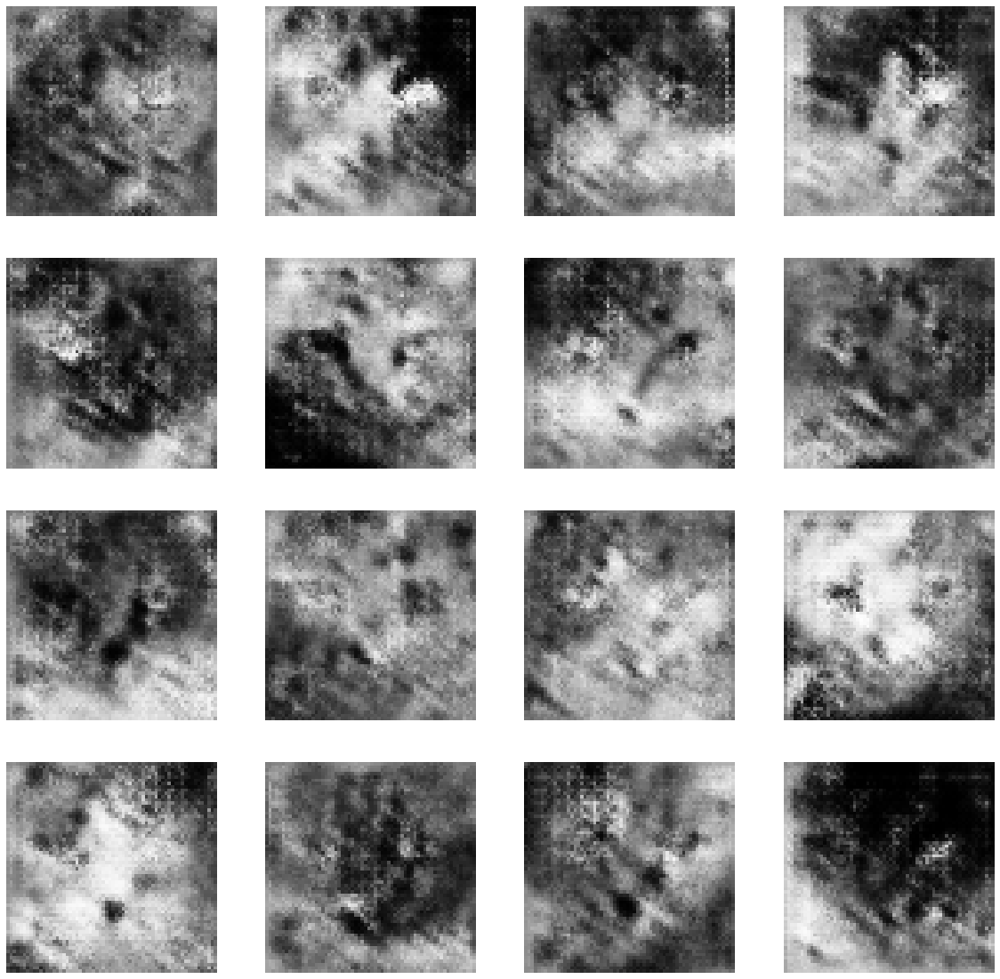

Time for epoch 14 is 46.032134771347046 sec
Epoch 14 batch 20
Epoch 14 batch 40
Epoch 14 batch 60
Epoch 14 batch 80
Epoch 14 batch 100
Epoch 14 batch 120
Epoch 14 batch 140
Epoch 14 batch 160
Epoch 14 batch 180
Epoch 14 batch 200
Epoch 14 batch 220
Epoch 14 batch 240


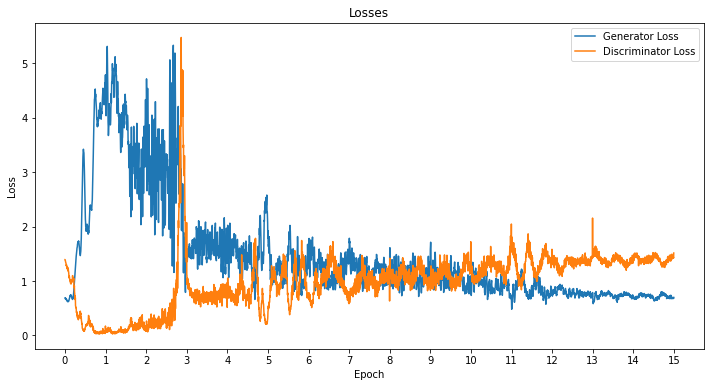

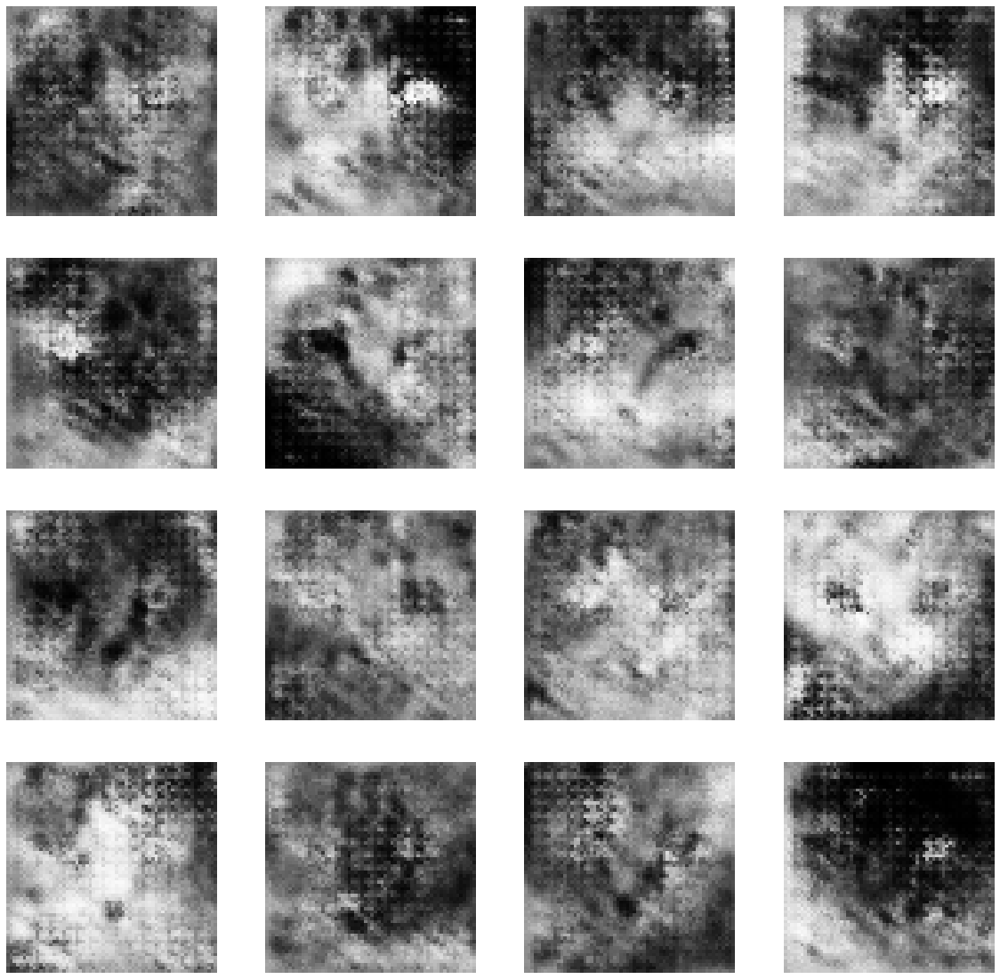

Time for epoch 15 is 45.779029846191406 sec
Epoch 15 batch 20
Epoch 15 batch 40
Epoch 15 batch 60
Epoch 15 batch 80
Epoch 15 batch 100
Epoch 15 batch 120
Epoch 15 batch 140
Epoch 15 batch 160
Epoch 15 batch 180
Epoch 15 batch 200
Epoch 15 batch 220
Epoch 15 batch 240


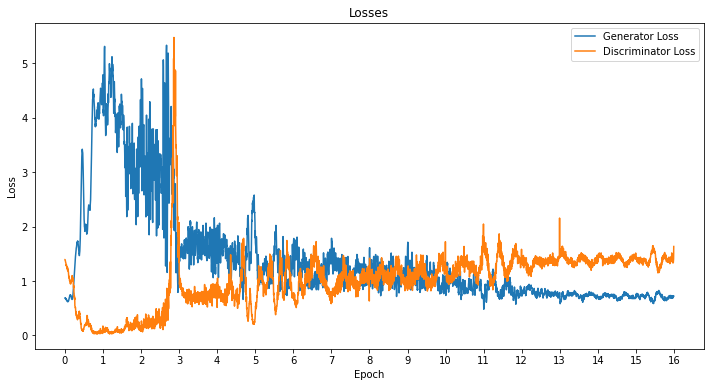

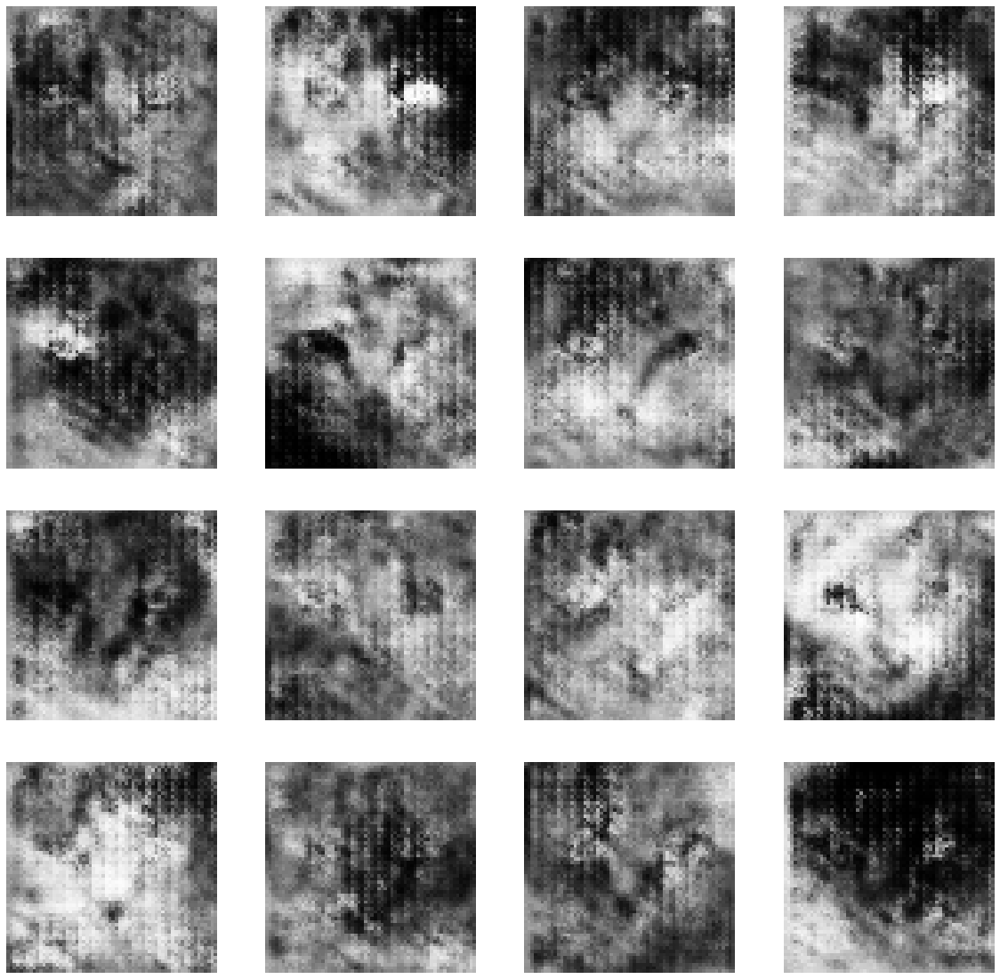

Time for epoch 16 is 45.811522245407104 sec
Epoch 16 batch 20
Epoch 16 batch 40
Epoch 16 batch 60
Epoch 16 batch 80
Epoch 16 batch 100
Epoch 16 batch 120
Epoch 16 batch 140
Epoch 16 batch 160
Epoch 16 batch 180
Epoch 16 batch 200
Epoch 16 batch 220
Epoch 16 batch 240


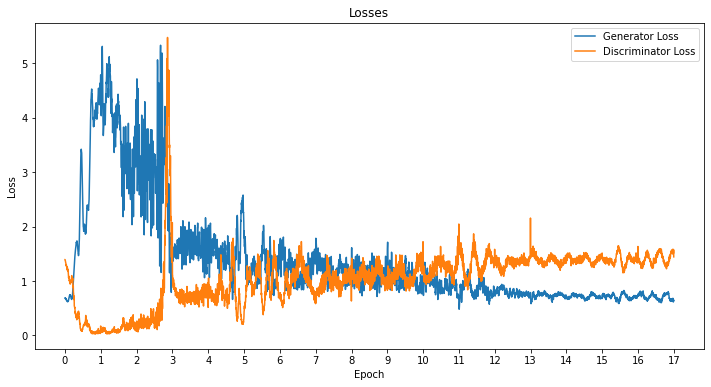

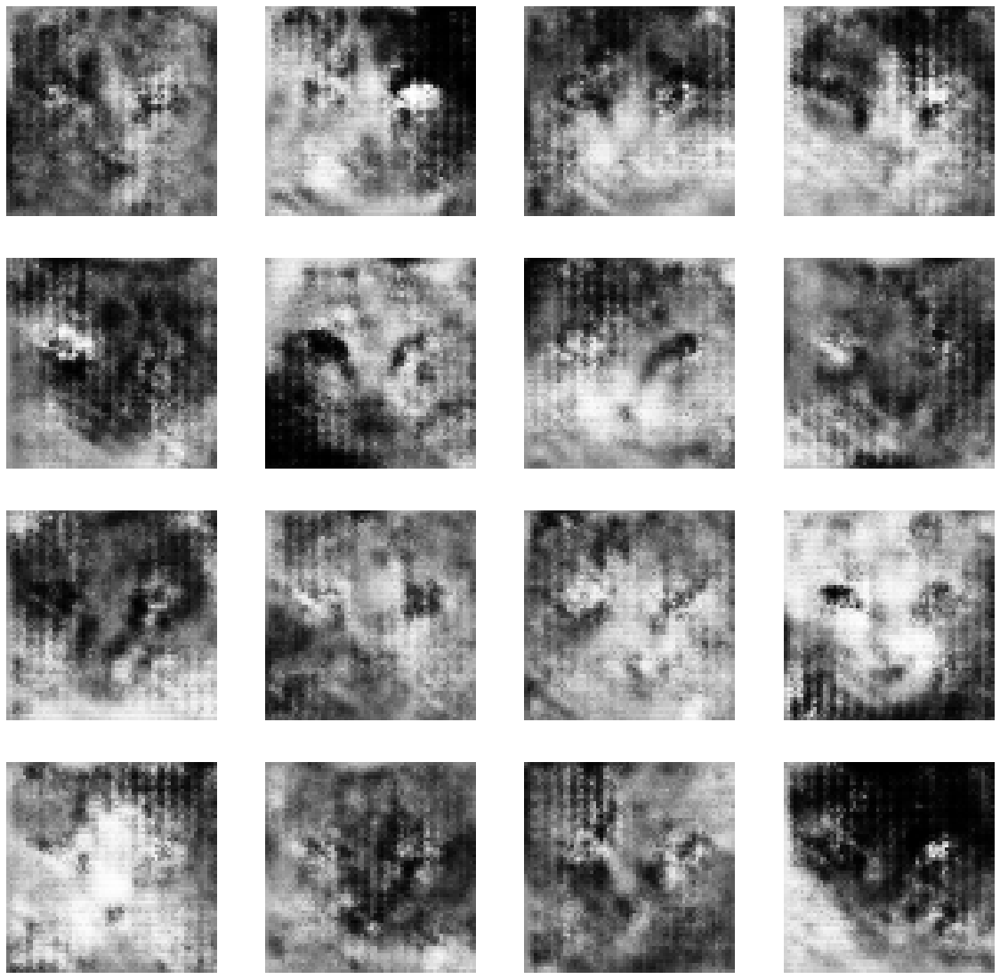

Time for epoch 17 is 45.83619451522827 sec
Epoch 17 batch 20
Epoch 17 batch 40
Epoch 17 batch 60
Epoch 17 batch 80
Epoch 17 batch 100
Epoch 17 batch 120
Epoch 17 batch 140
Epoch 17 batch 160
Epoch 17 batch 180
Epoch 17 batch 200
Epoch 17 batch 220
Epoch 17 batch 240


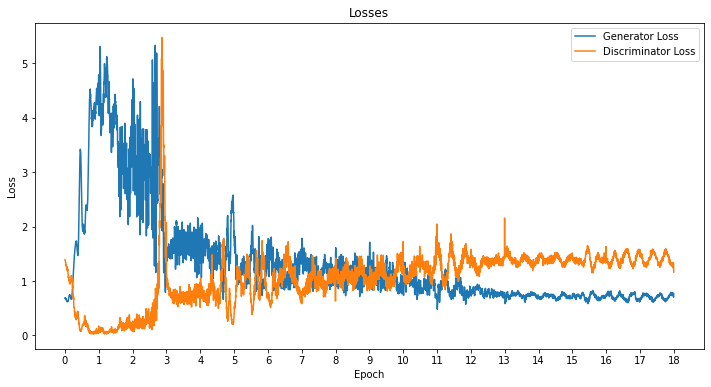

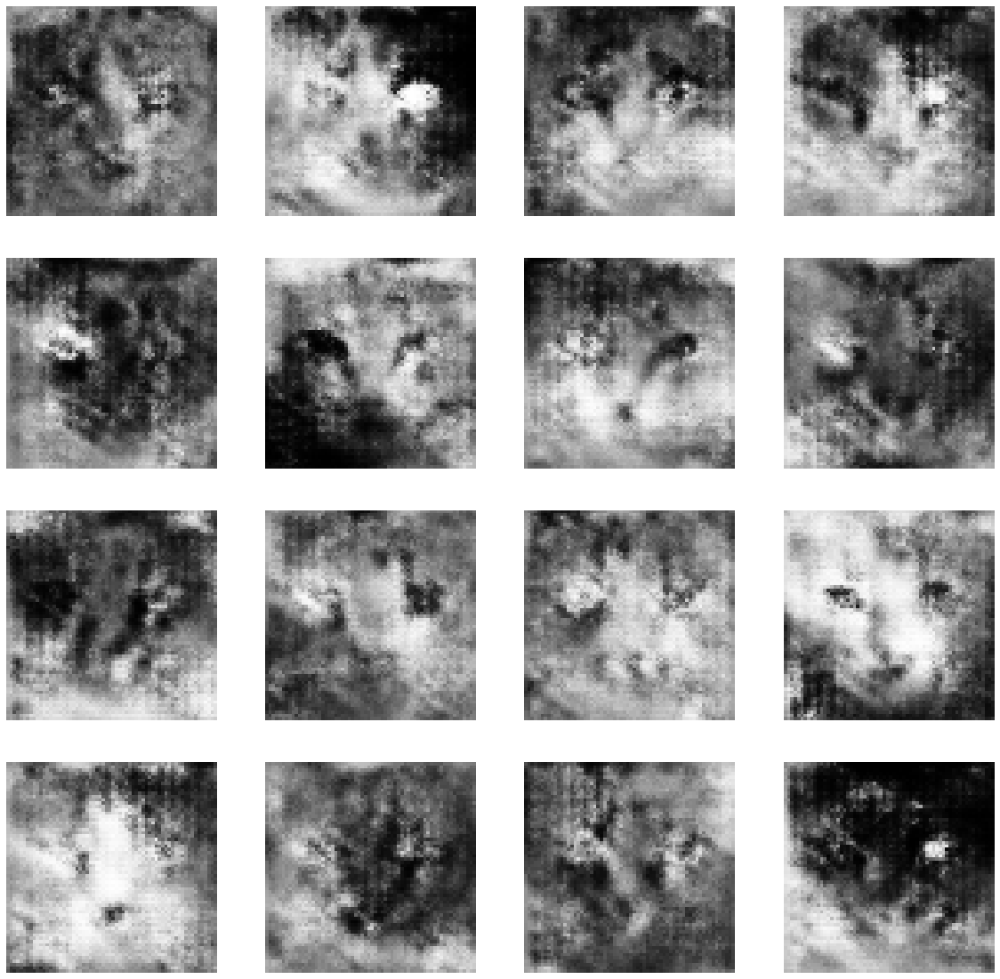

Time for epoch 18 is 45.362823724746704 sec
Epoch 18 batch 20
Epoch 18 batch 40
Epoch 18 batch 60
Epoch 18 batch 80
Epoch 18 batch 100
Epoch 18 batch 120
Epoch 18 batch 140
Epoch 18 batch 160
Epoch 18 batch 180
Epoch 18 batch 200
Epoch 18 batch 220
Epoch 18 batch 240


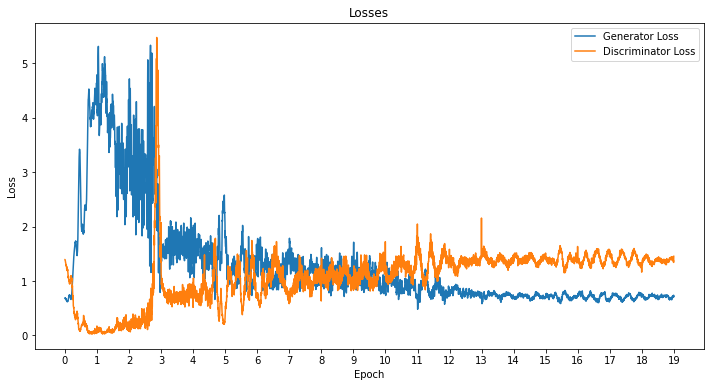

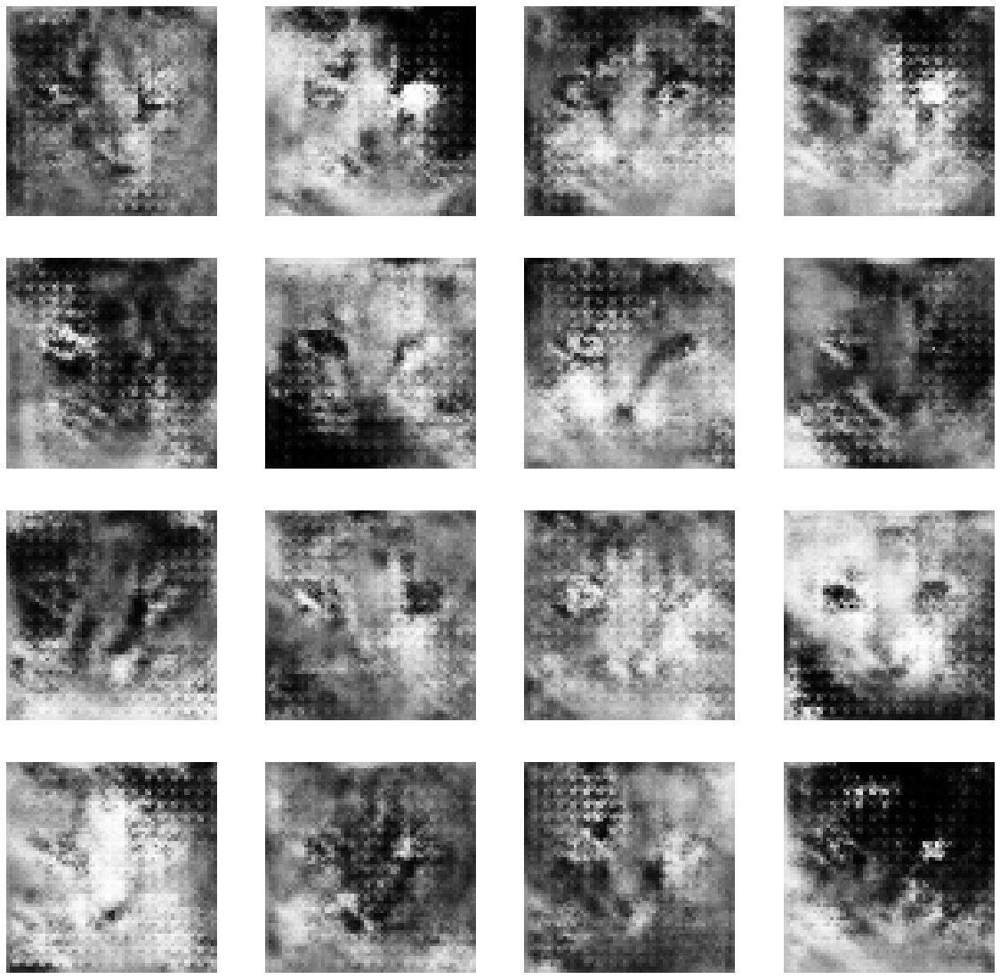

Time for epoch 19 is 45.35742259025574 sec
Epoch 19 batch 20
Epoch 19 batch 40
Epoch 19 batch 60
Epoch 19 batch 80
Epoch 19 batch 100
Epoch 19 batch 120
Epoch 19 batch 140
Epoch 19 batch 160
Epoch 19 batch 180
Epoch 19 batch 200
Epoch 19 batch 220
Epoch 19 batch 240


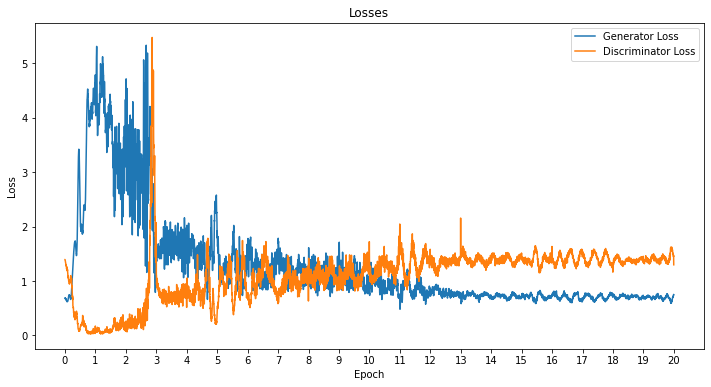

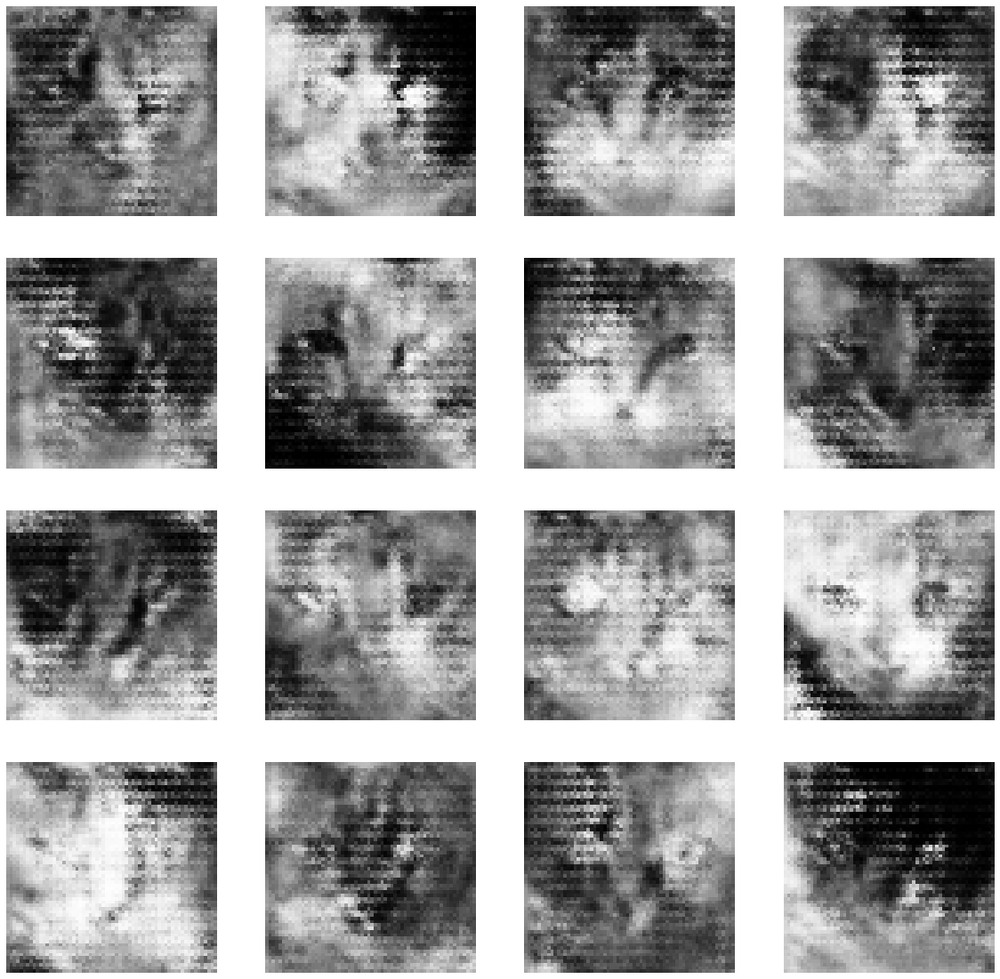

Time for epoch 20 is 44.86296606063843 sec
Epoch 20 batch 20
Epoch 20 batch 40
Epoch 20 batch 60
Epoch 20 batch 80
Epoch 20 batch 100
Epoch 20 batch 120
Epoch 20 batch 140
Epoch 20 batch 160
Epoch 20 batch 180
Epoch 20 batch 200
Epoch 20 batch 220
Epoch 20 batch 240


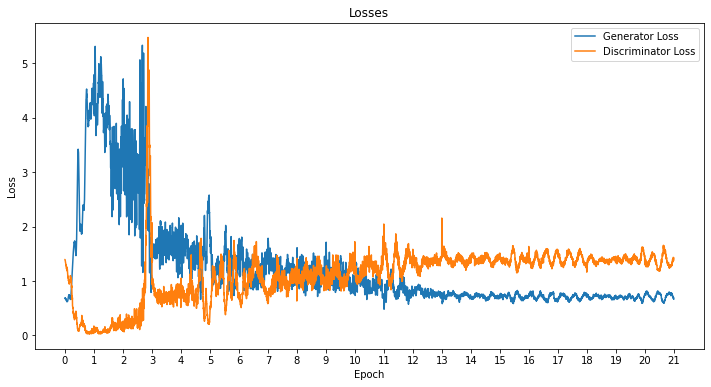

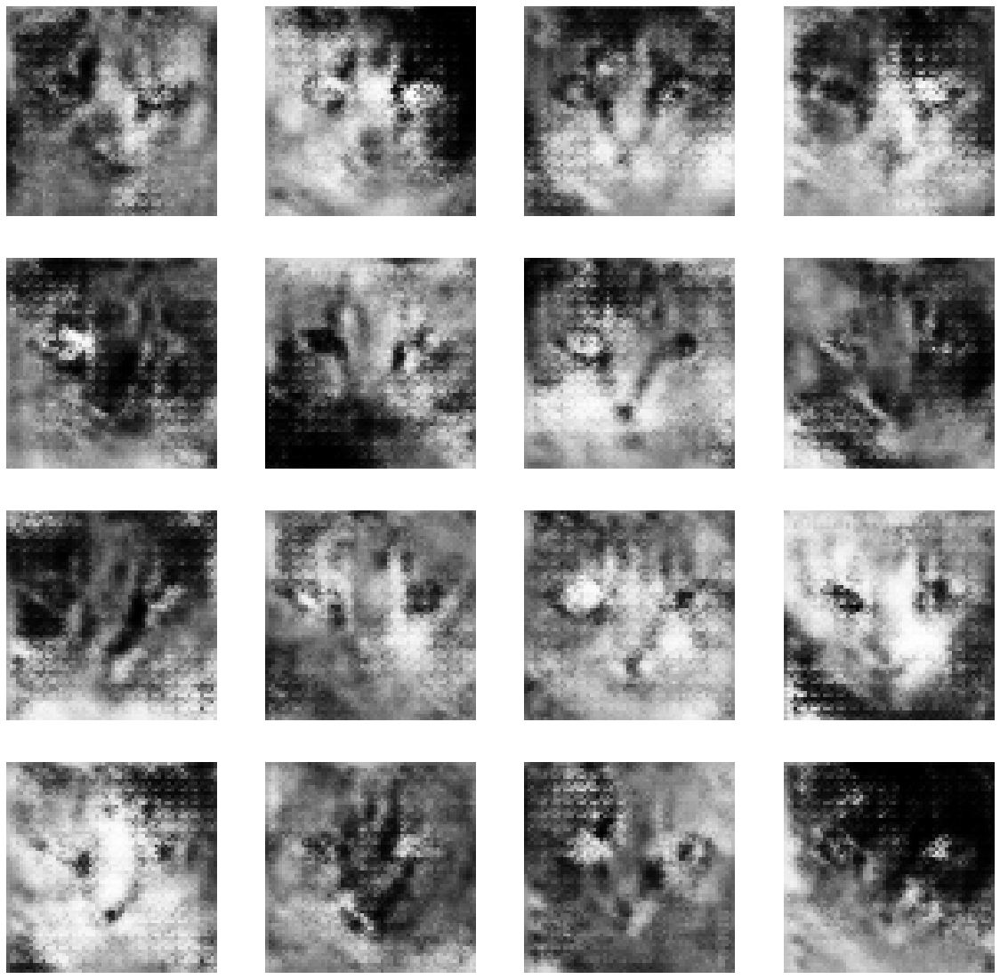

Time for epoch 21 is 62.65830731391907 sec
Epoch 21 batch 20
Epoch 21 batch 40
Epoch 21 batch 60
Epoch 21 batch 80
Epoch 21 batch 100
Epoch 21 batch 120
Epoch 21 batch 140
Epoch 21 batch 160
Epoch 21 batch 180
Epoch 21 batch 200
Epoch 21 batch 220
Epoch 21 batch 240


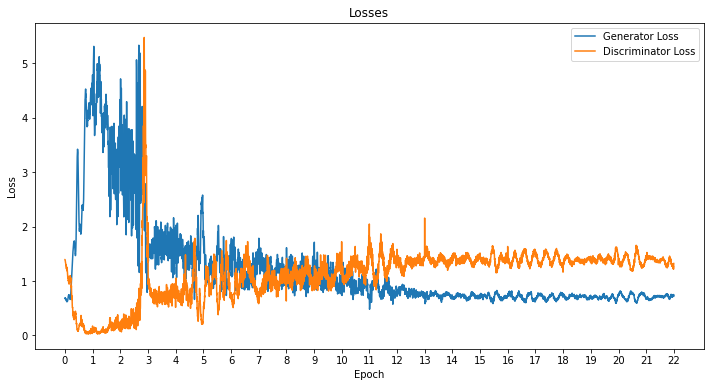

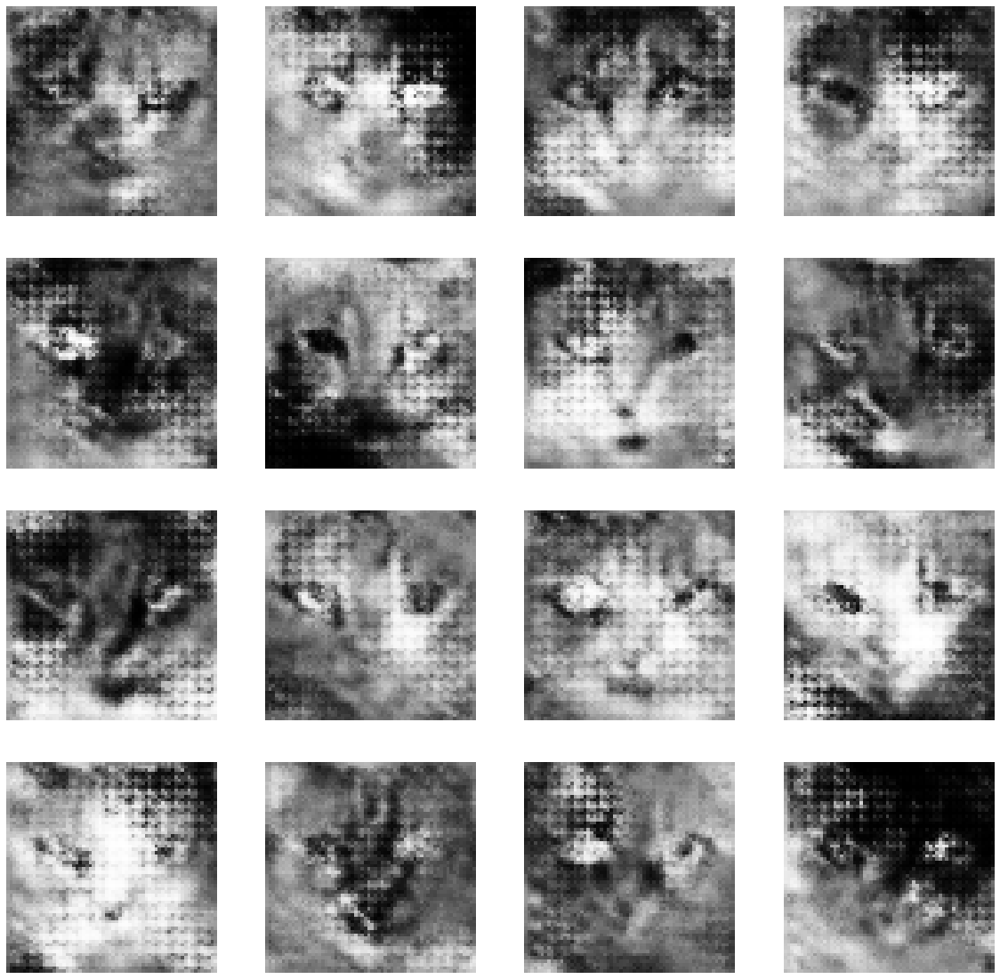

Time for epoch 22 is 67.14314889907837 sec
Epoch 22 batch 20
Epoch 22 batch 40
Epoch 22 batch 60
Epoch 22 batch 80
Epoch 22 batch 100
Epoch 22 batch 120
Epoch 22 batch 140
Epoch 22 batch 160
Epoch 22 batch 180
Epoch 22 batch 200
Epoch 22 batch 220
Epoch 22 batch 240


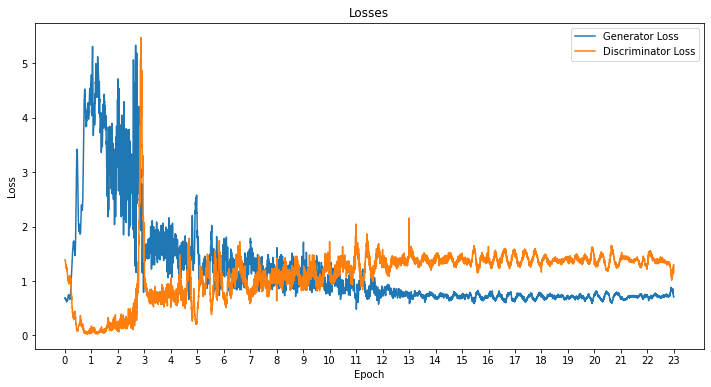

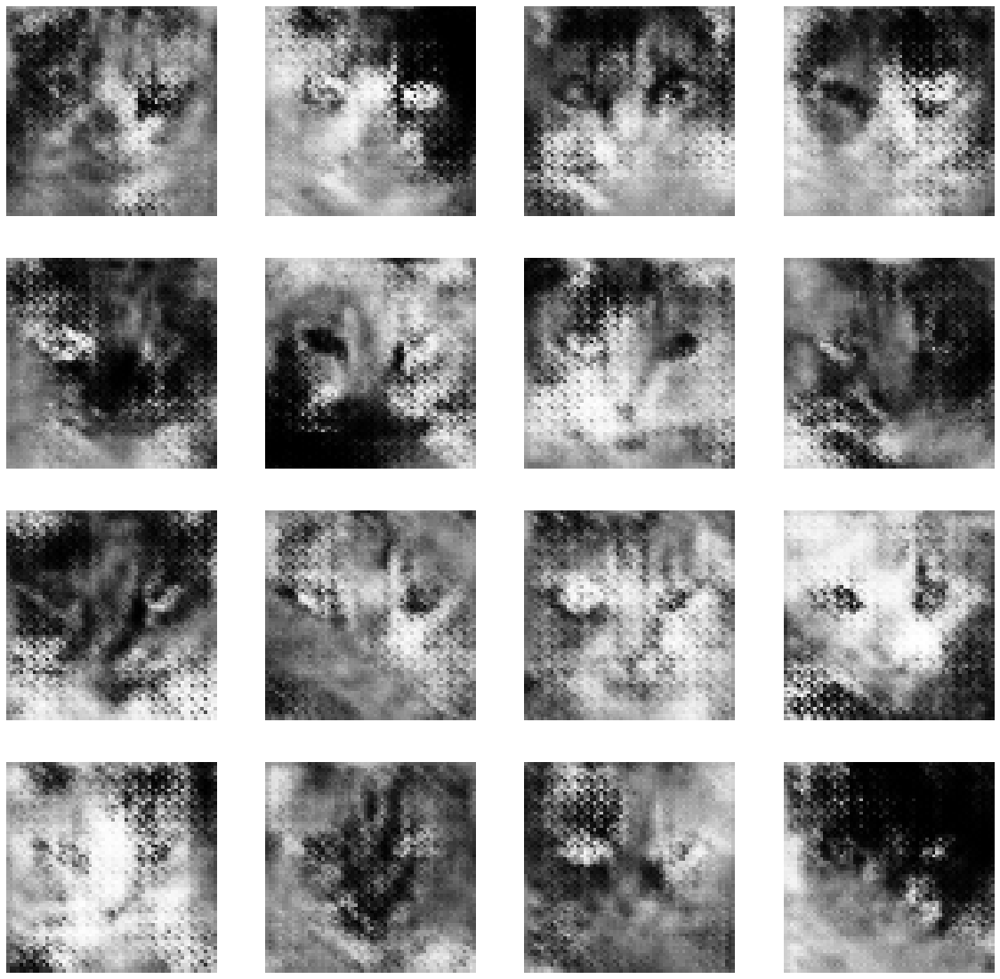

Time for epoch 23 is 66.75522637367249 sec
Epoch 23 batch 20
Epoch 23 batch 40
Epoch 23 batch 60
Epoch 23 batch 80
Epoch 23 batch 100
Epoch 23 batch 120
Epoch 23 batch 140
Epoch 23 batch 160
Epoch 23 batch 180
Epoch 23 batch 200
Epoch 23 batch 220
Epoch 23 batch 240


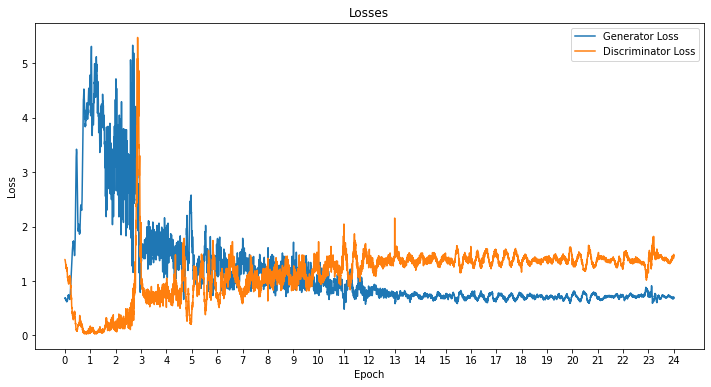

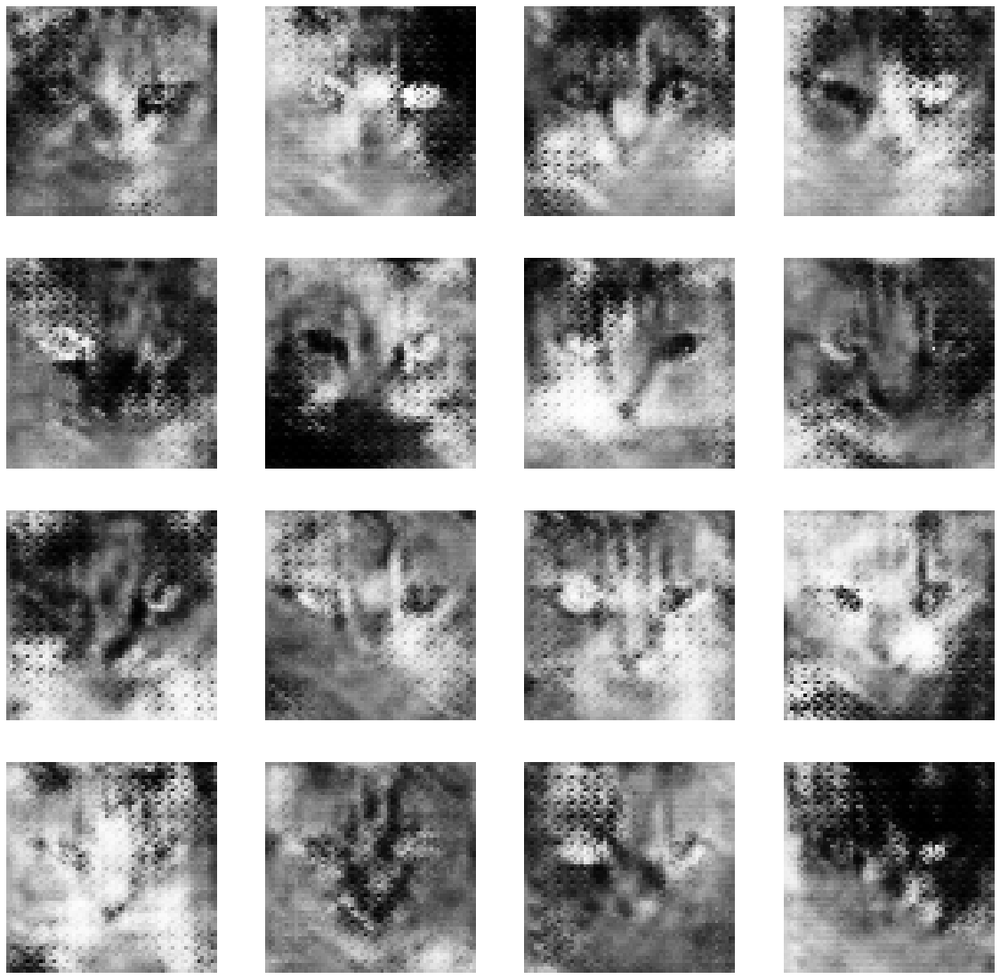

Time for epoch 24 is 66.81211614608765 sec
Epoch 24 batch 20
Epoch 24 batch 40
Epoch 24 batch 60
Epoch 24 batch 80
Epoch 24 batch 100
Epoch 24 batch 120
Epoch 24 batch 140
Epoch 24 batch 160
Epoch 24 batch 180
Epoch 24 batch 200
Epoch 24 batch 220
Epoch 24 batch 240


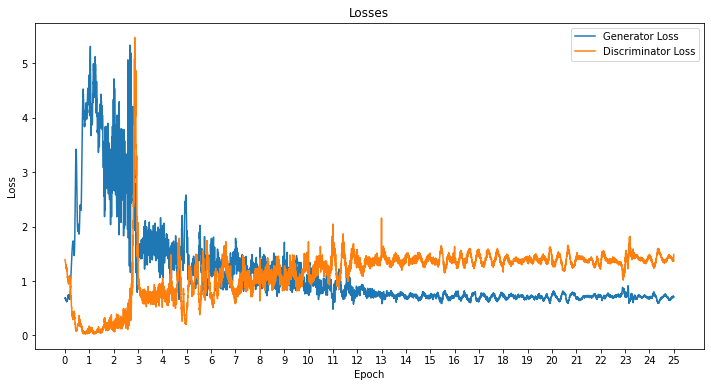

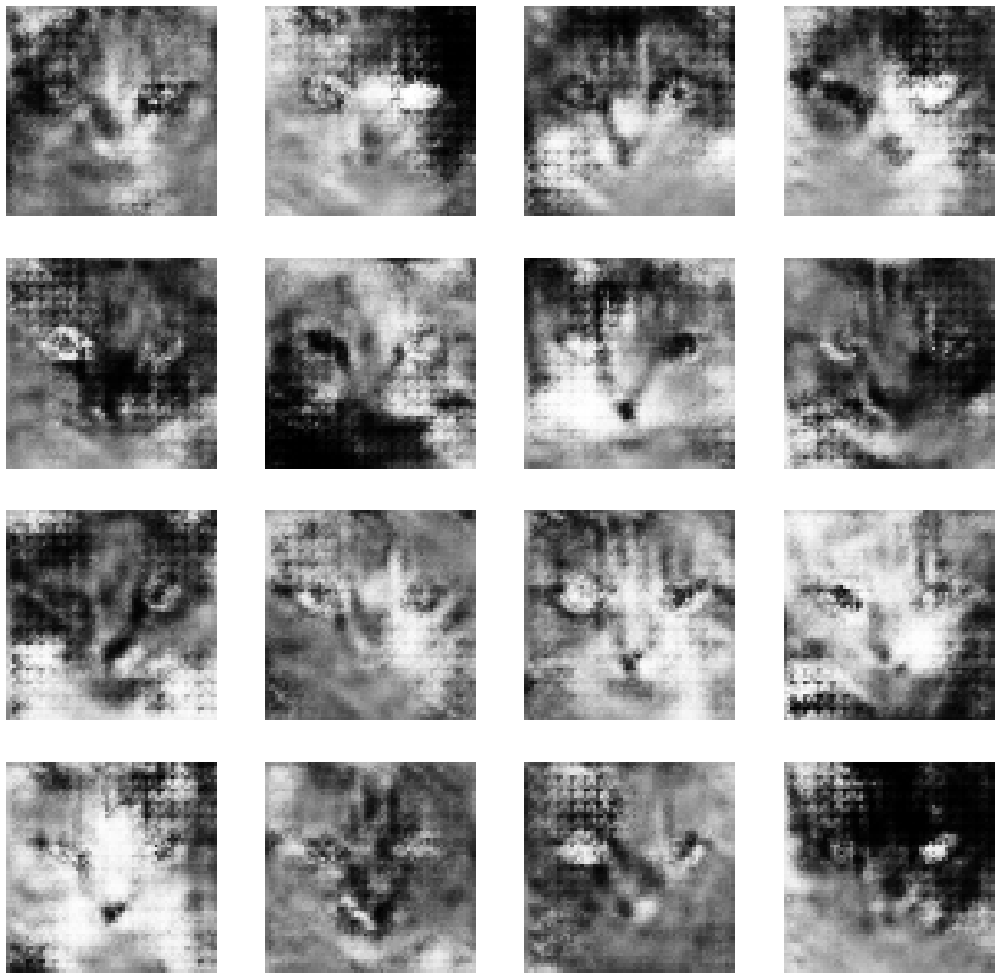

Time for epoch 25 is 61.97329878807068 sec
Epoch 25 batch 20
Epoch 25 batch 40
Epoch 25 batch 60
Epoch 25 batch 80
Epoch 25 batch 100
Epoch 25 batch 120
Epoch 25 batch 140
Epoch 25 batch 160
Epoch 25 batch 180
Epoch 25 batch 200
Epoch 25 batch 220
Epoch 25 batch 240


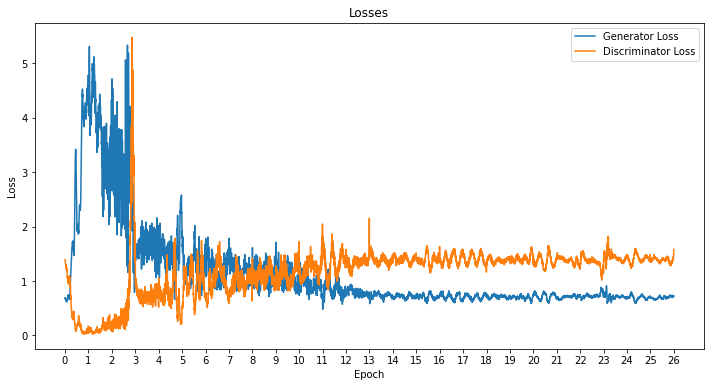

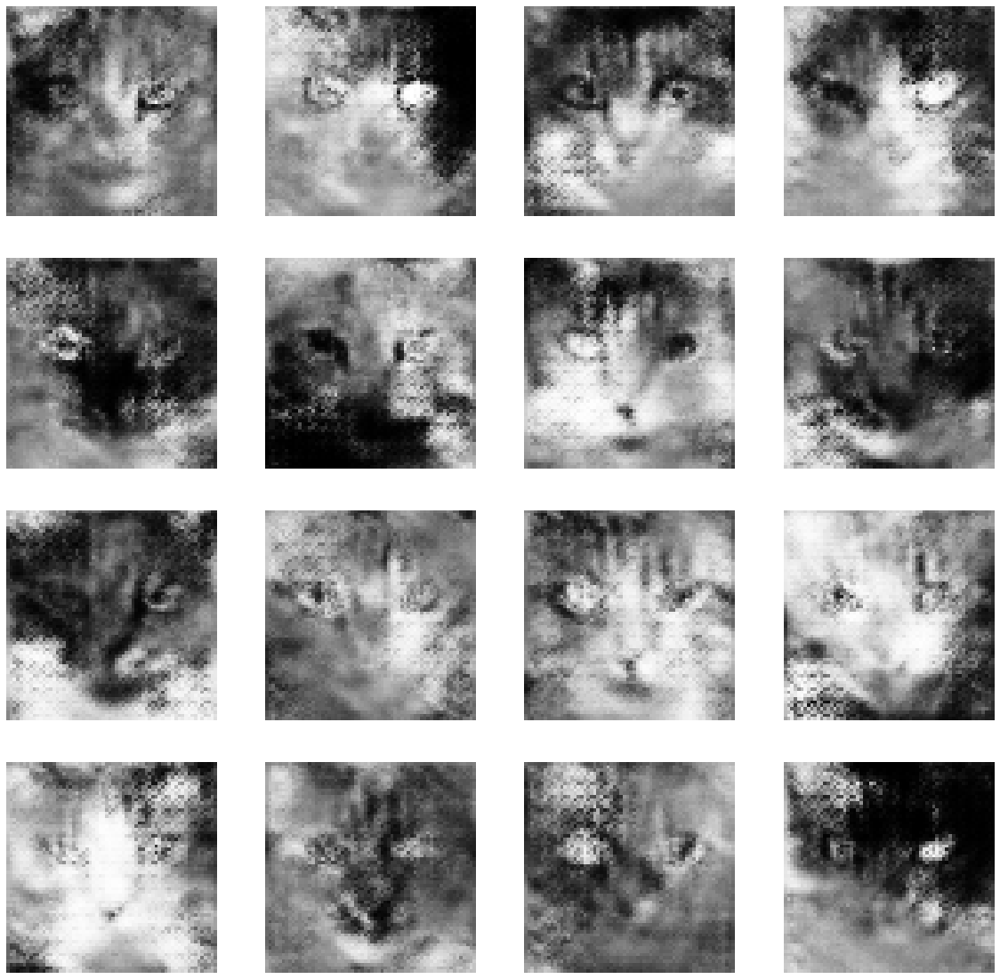

Time for epoch 26 is 60.590754985809326 sec
Epoch 26 batch 20
Epoch 26 batch 40
Epoch 26 batch 60
Epoch 26 batch 80
Epoch 26 batch 100
Epoch 26 batch 120
Epoch 26 batch 140
Epoch 26 batch 160
Epoch 26 batch 180
Epoch 26 batch 200
Epoch 26 batch 220
Epoch 26 batch 240


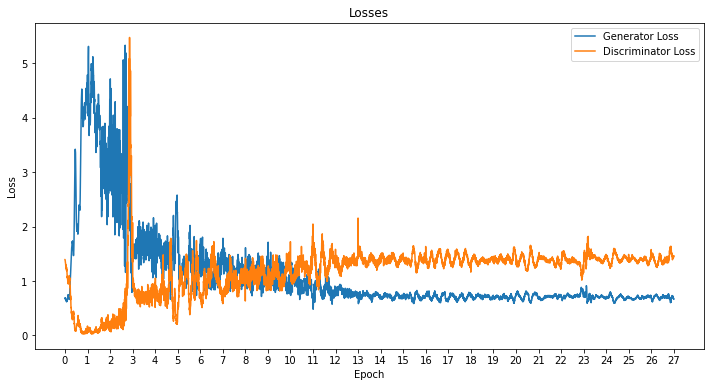

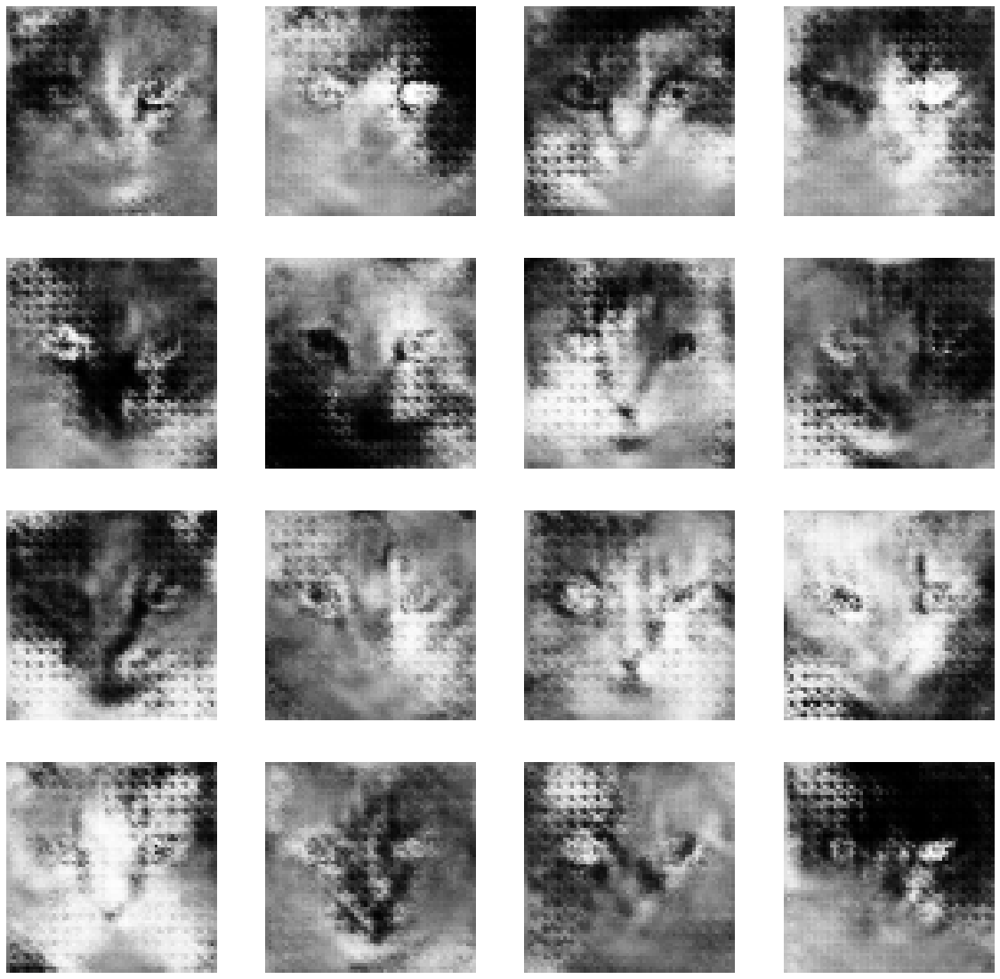

Time for epoch 27 is 67.06791186332703 sec
Epoch 27 batch 20
Epoch 27 batch 40
Epoch 27 batch 60
Epoch 27 batch 80
Epoch 27 batch 100
Epoch 27 batch 120
Epoch 27 batch 140
Epoch 27 batch 160
Epoch 27 batch 180
Epoch 27 batch 200
Epoch 27 batch 220
Epoch 27 batch 240


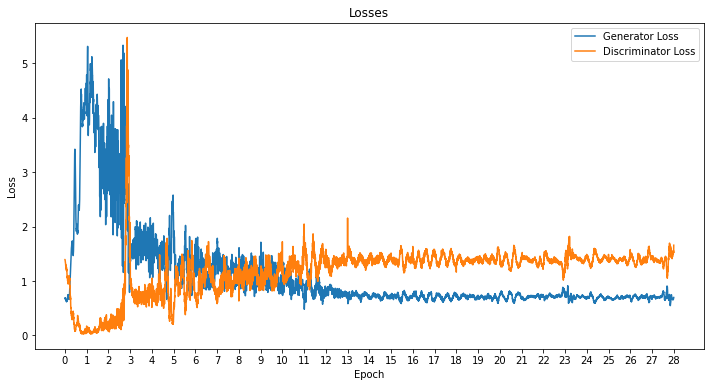

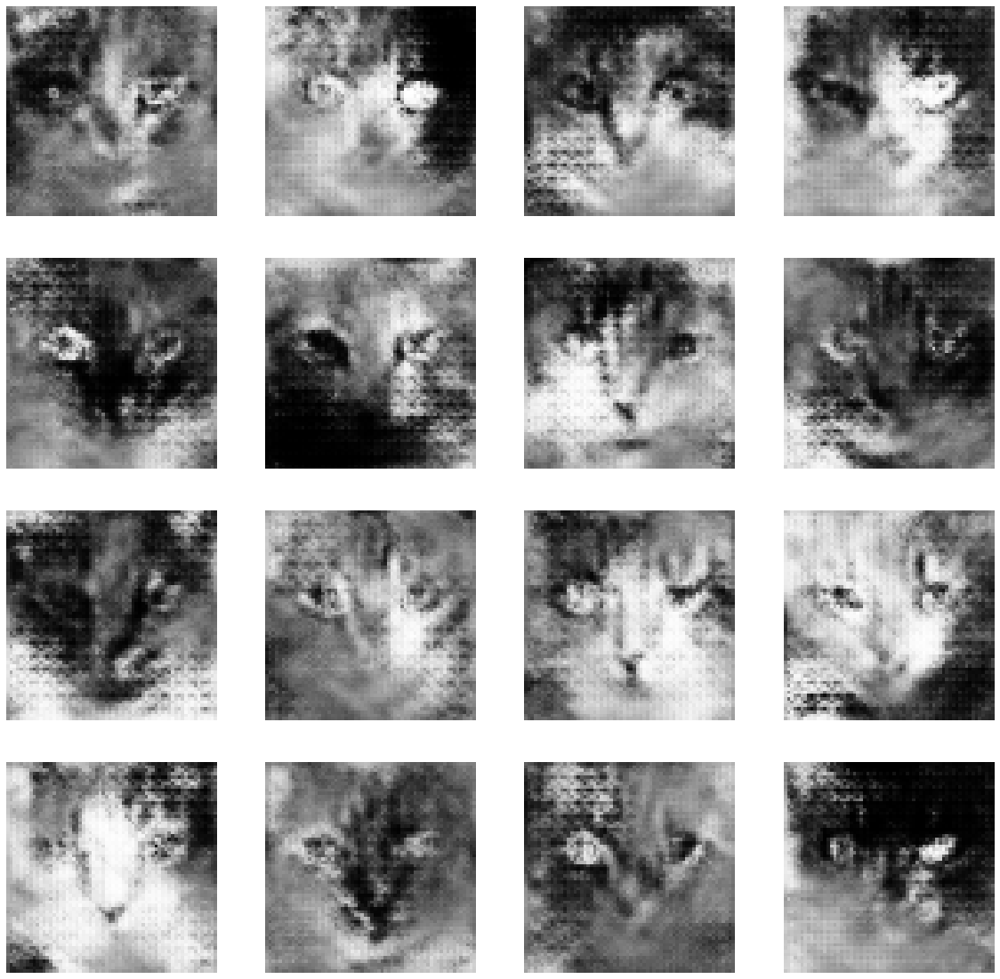

Time for epoch 28 is 67.14209628105164 sec
Epoch 28 batch 20
Epoch 28 batch 40
Epoch 28 batch 60
Epoch 28 batch 80
Epoch 28 batch 100
Epoch 28 batch 120
Epoch 28 batch 140
Epoch 28 batch 160
Epoch 28 batch 180
Epoch 28 batch 200
Epoch 28 batch 220
Epoch 28 batch 240


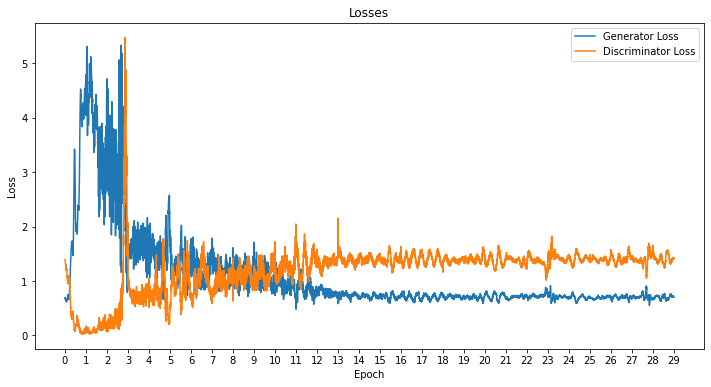

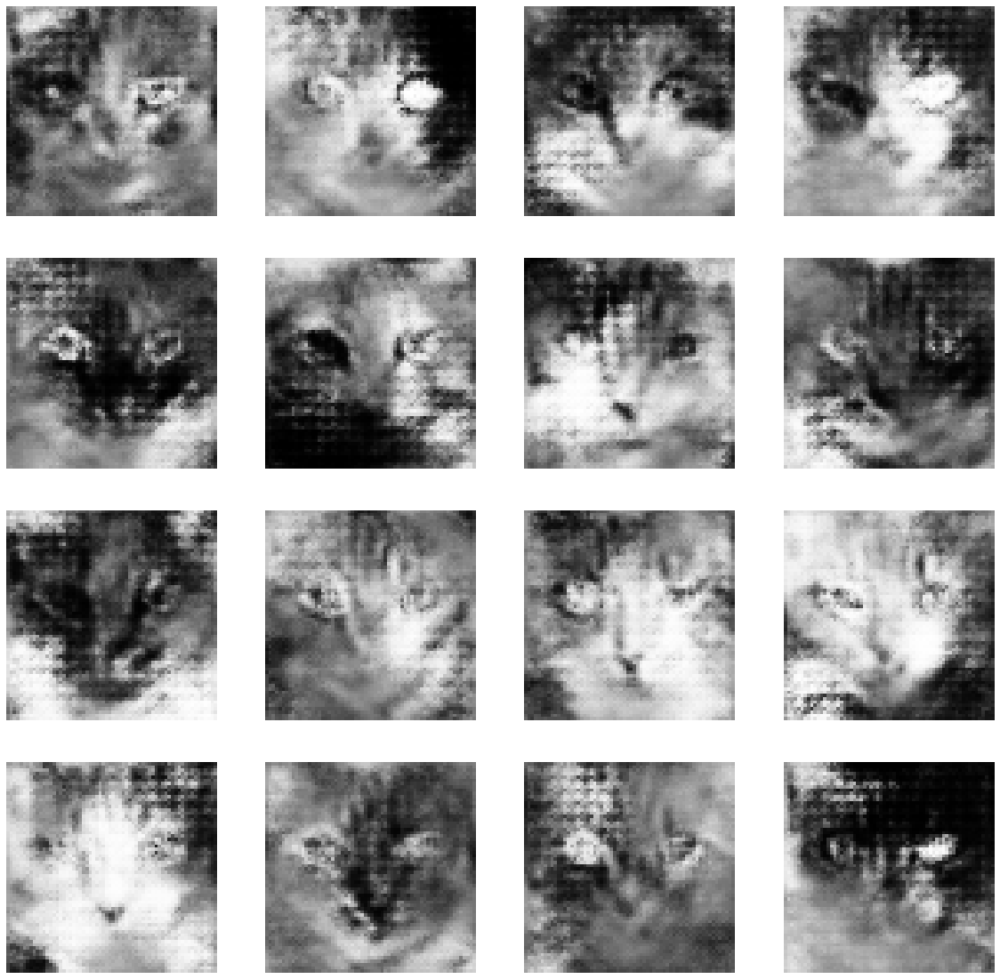

Time for epoch 29 is 67.31741309165955 sec
Epoch 29 batch 20
Epoch 29 batch 40
Epoch 29 batch 60
Epoch 29 batch 80
Epoch 29 batch 100
Epoch 29 batch 120
Epoch 29 batch 140
Epoch 29 batch 160
Epoch 29 batch 180
Epoch 29 batch 200
Epoch 29 batch 220
Epoch 29 batch 240


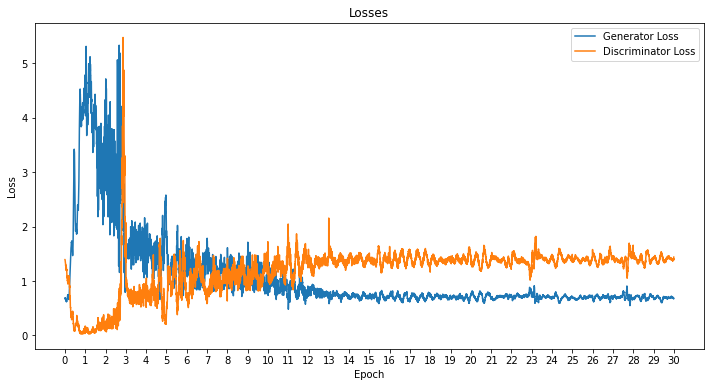

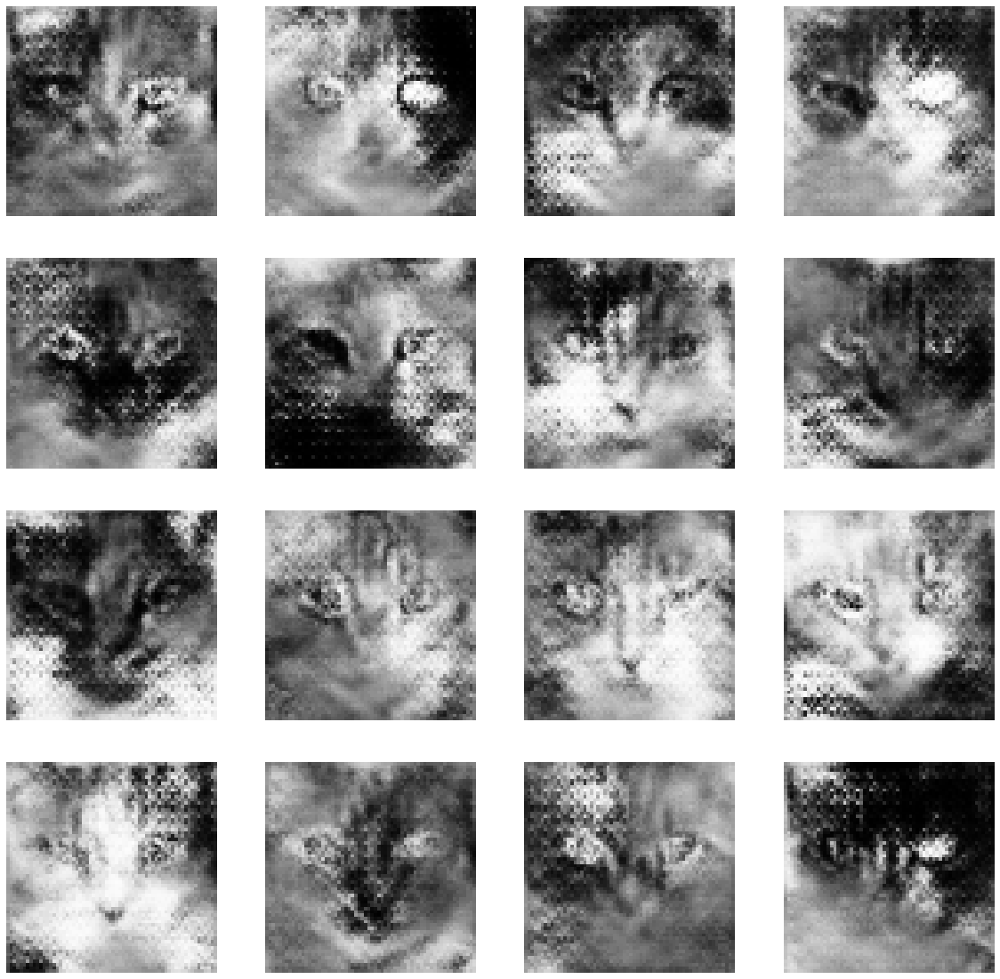

Time for epoch 30 is 66.65273308753967 sec
Epoch 30 batch 20
Epoch 30 batch 40
Epoch 30 batch 60
Epoch 30 batch 80
Epoch 30 batch 100
Epoch 30 batch 120
Epoch 30 batch 140
Epoch 30 batch 160
Epoch 30 batch 180
Epoch 30 batch 200
Epoch 30 batch 220
Epoch 30 batch 240


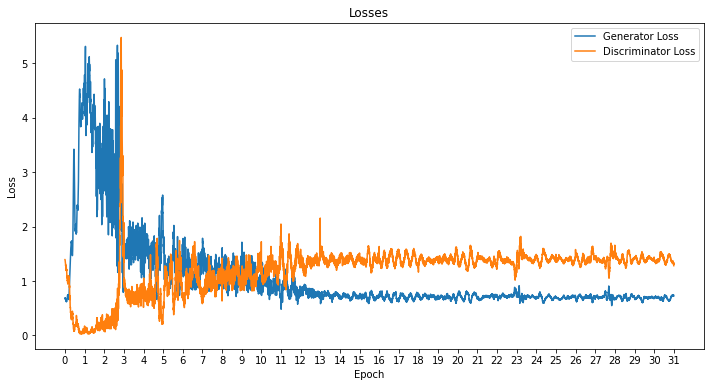

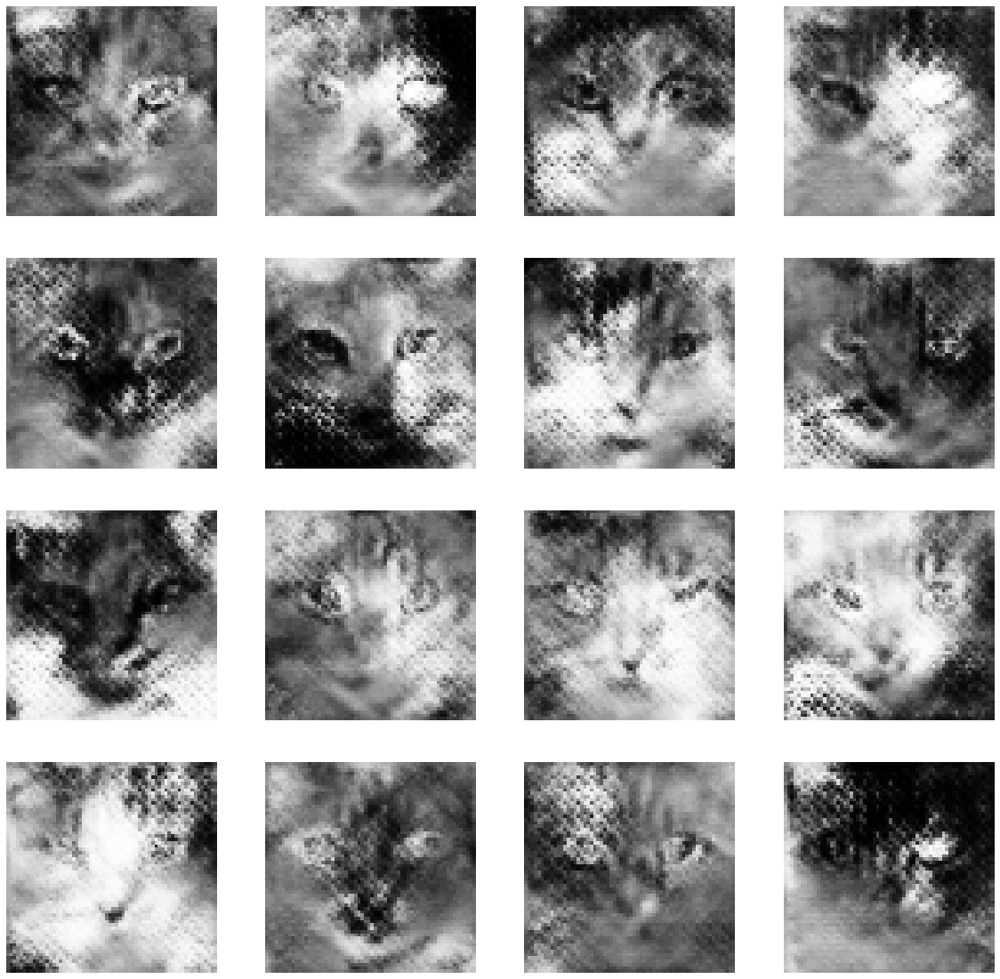

Time for epoch 31 is 59.43175530433655 sec
Epoch 31 batch 20
Epoch 31 batch 40
Epoch 31 batch 60
Epoch 31 batch 80
Epoch 31 batch 100
Epoch 31 batch 120
Epoch 31 batch 140
Epoch 31 batch 160
Epoch 31 batch 180
Epoch 31 batch 200
Epoch 31 batch 220
Epoch 31 batch 240


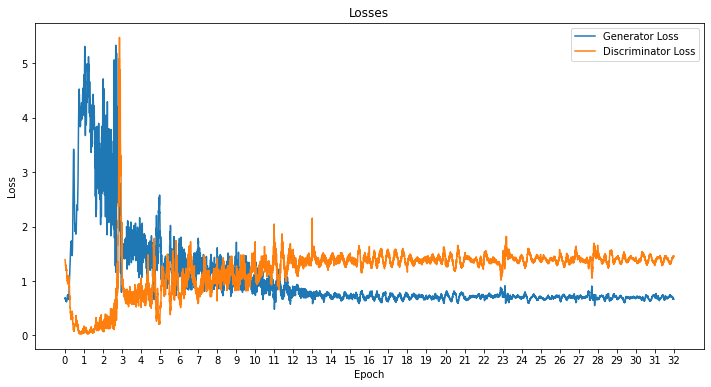

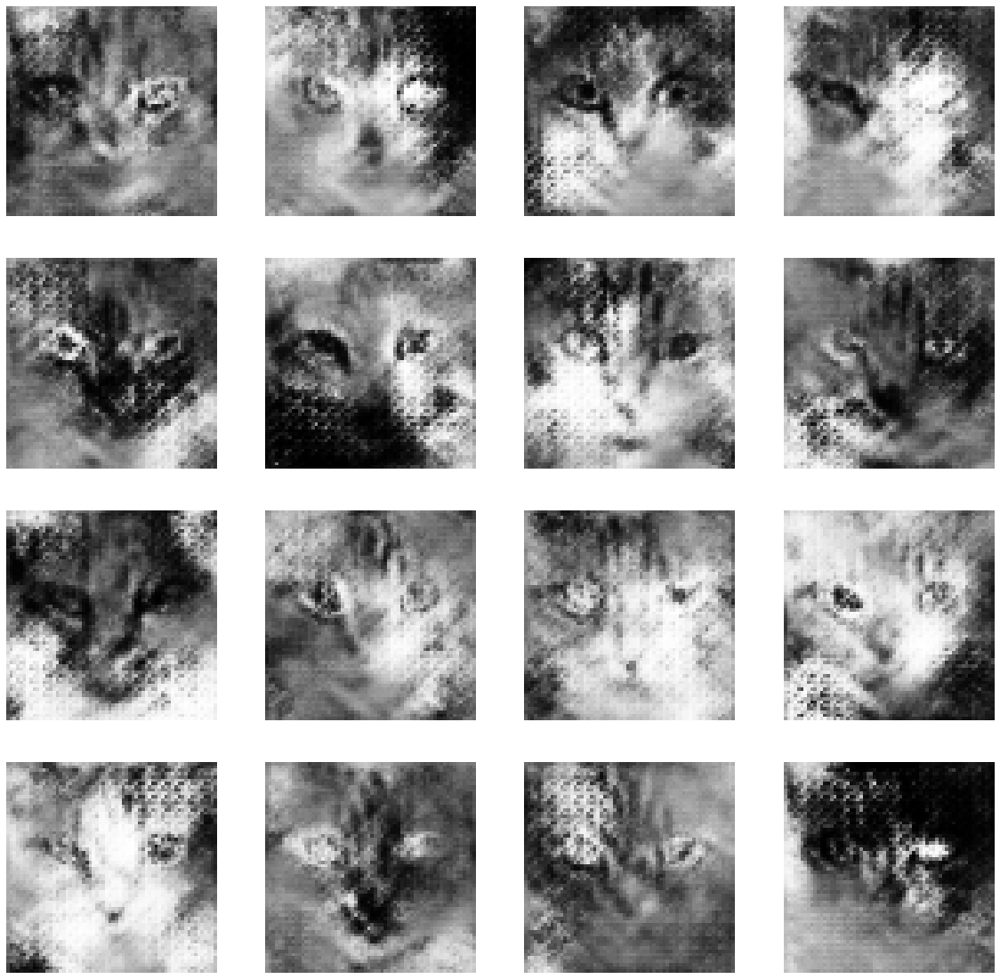

Time for epoch 32 is 63.73107933998108 sec
Epoch 32 batch 20
Epoch 32 batch 40
Epoch 32 batch 60
Epoch 32 batch 80
Epoch 32 batch 100
Epoch 32 batch 120
Epoch 32 batch 140
Epoch 32 batch 160
Epoch 32 batch 180
Epoch 32 batch 200
Epoch 32 batch 220
Epoch 32 batch 240


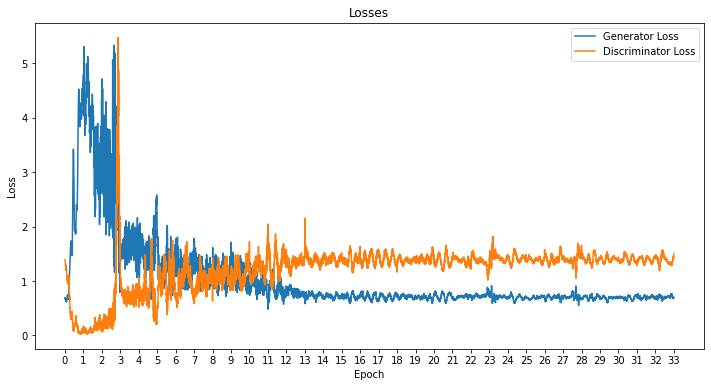

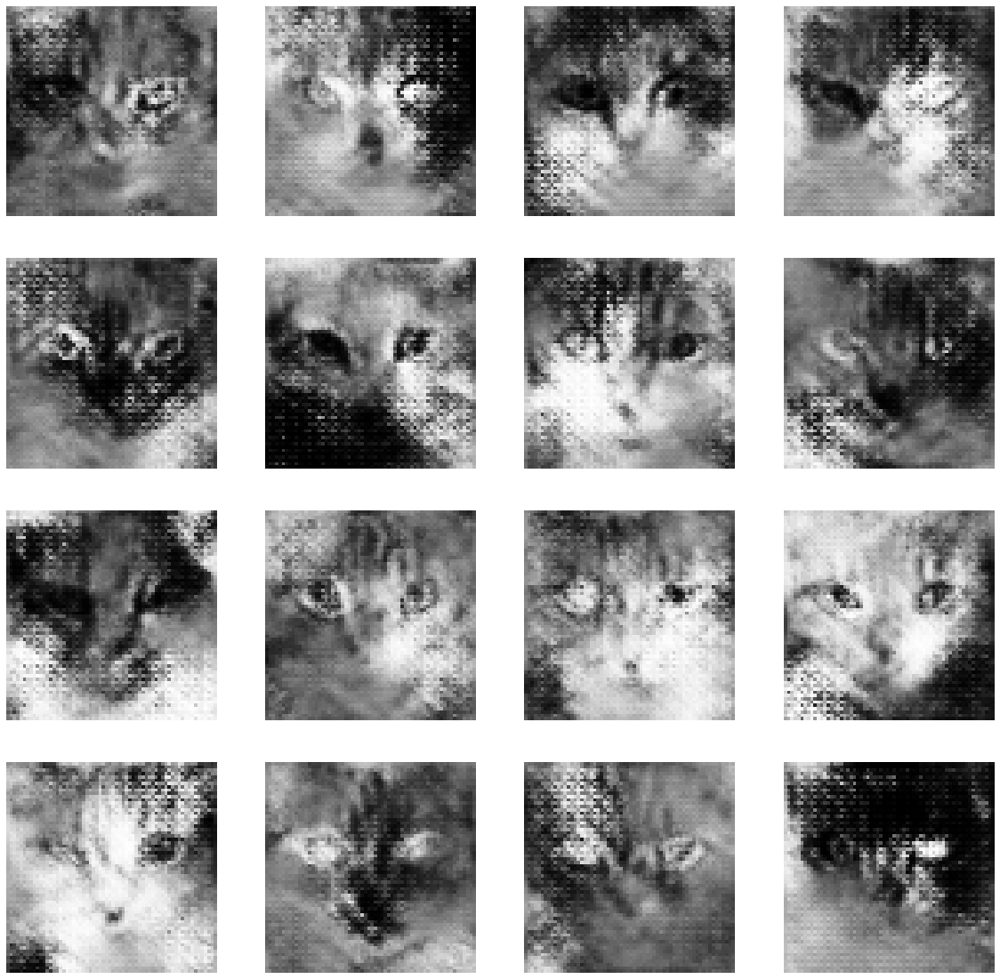

Time for epoch 33 is 66.921053647995 sec
Epoch 33 batch 20
Epoch 33 batch 40
Epoch 33 batch 60
Epoch 33 batch 80
Epoch 33 batch 100
Epoch 33 batch 120
Epoch 33 batch 140
Epoch 33 batch 160
Epoch 33 batch 180
Epoch 33 batch 200
Epoch 33 batch 220
Epoch 33 batch 240


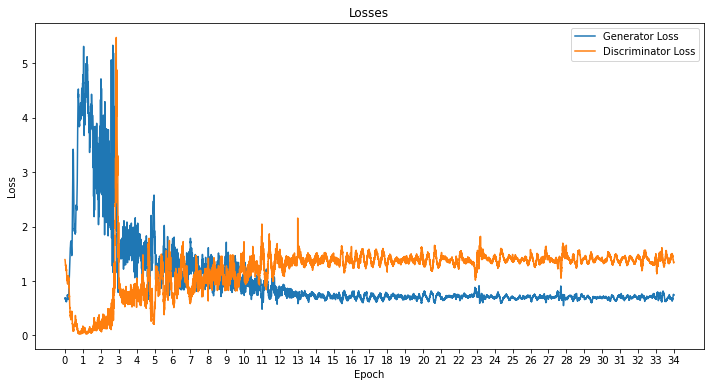

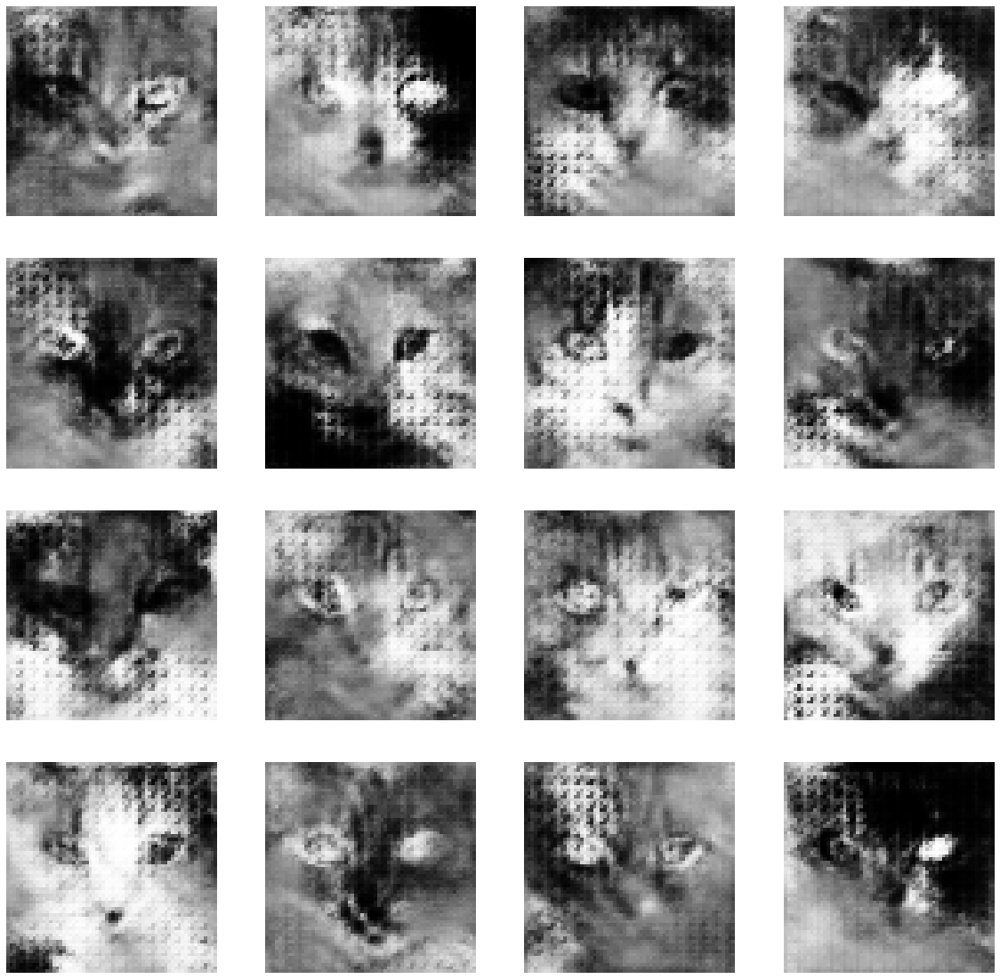

Time for epoch 34 is 66.75107049942017 sec
Epoch 34 batch 20
Epoch 34 batch 40
Epoch 34 batch 60
Epoch 34 batch 80
Epoch 34 batch 100
Epoch 34 batch 120
Epoch 34 batch 140
Epoch 34 batch 160
Epoch 34 batch 180
Epoch 34 batch 200
Epoch 34 batch 220
Epoch 34 batch 240


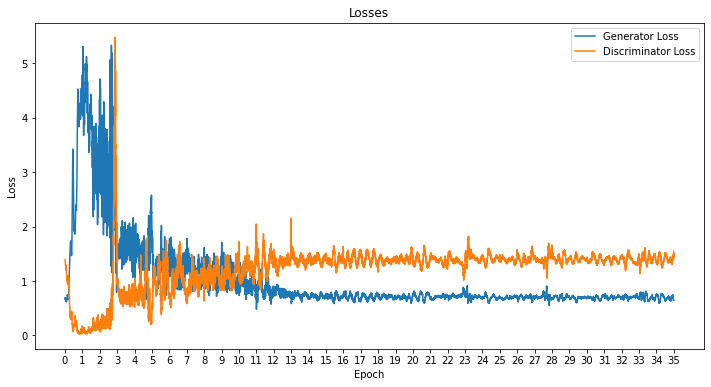

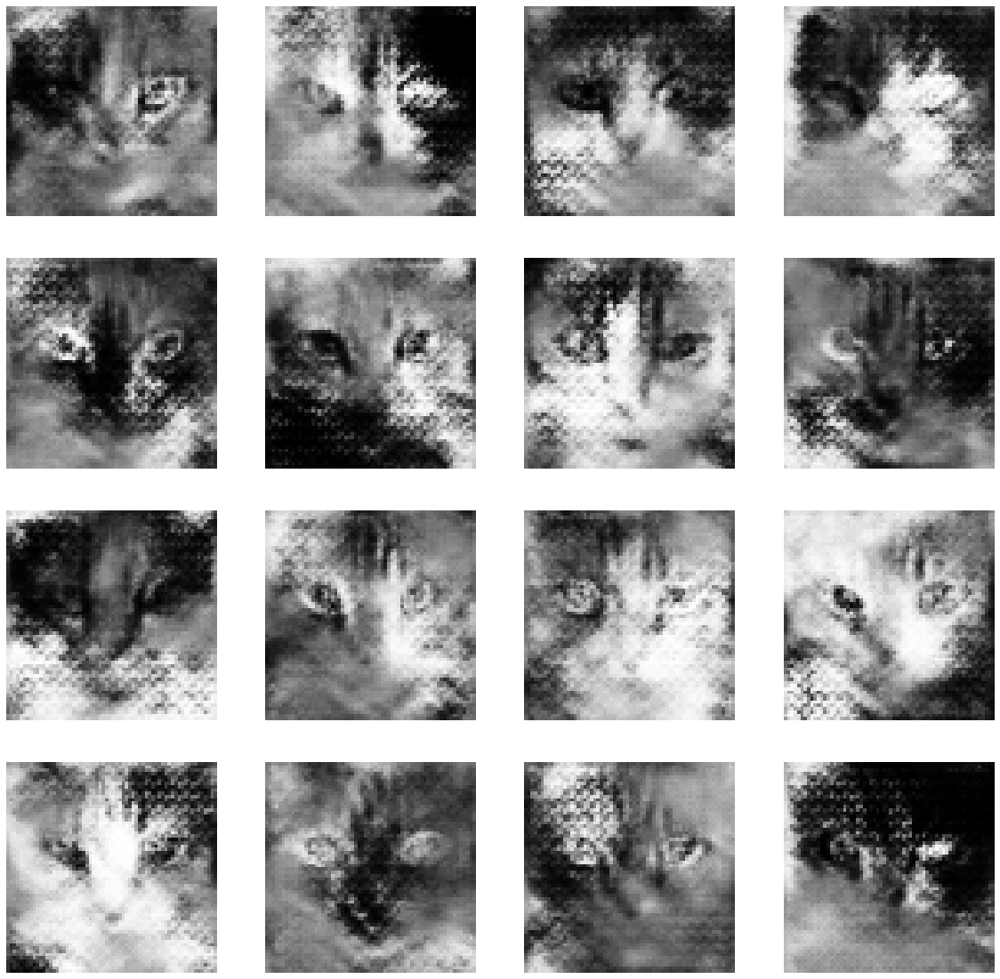

Time for epoch 35 is 66.7682273387909 sec
Epoch 35 batch 20
Epoch 35 batch 40
Epoch 35 batch 60
Epoch 35 batch 80
Epoch 35 batch 100
Epoch 35 batch 120
Epoch 35 batch 140
Epoch 35 batch 160
Epoch 35 batch 180
Epoch 35 batch 200
Epoch 35 batch 220
Epoch 35 batch 240


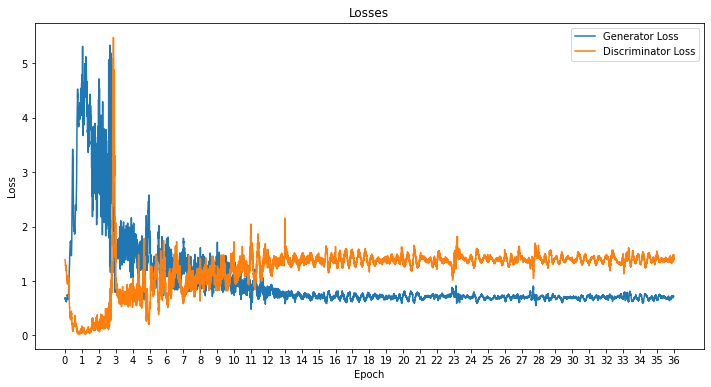

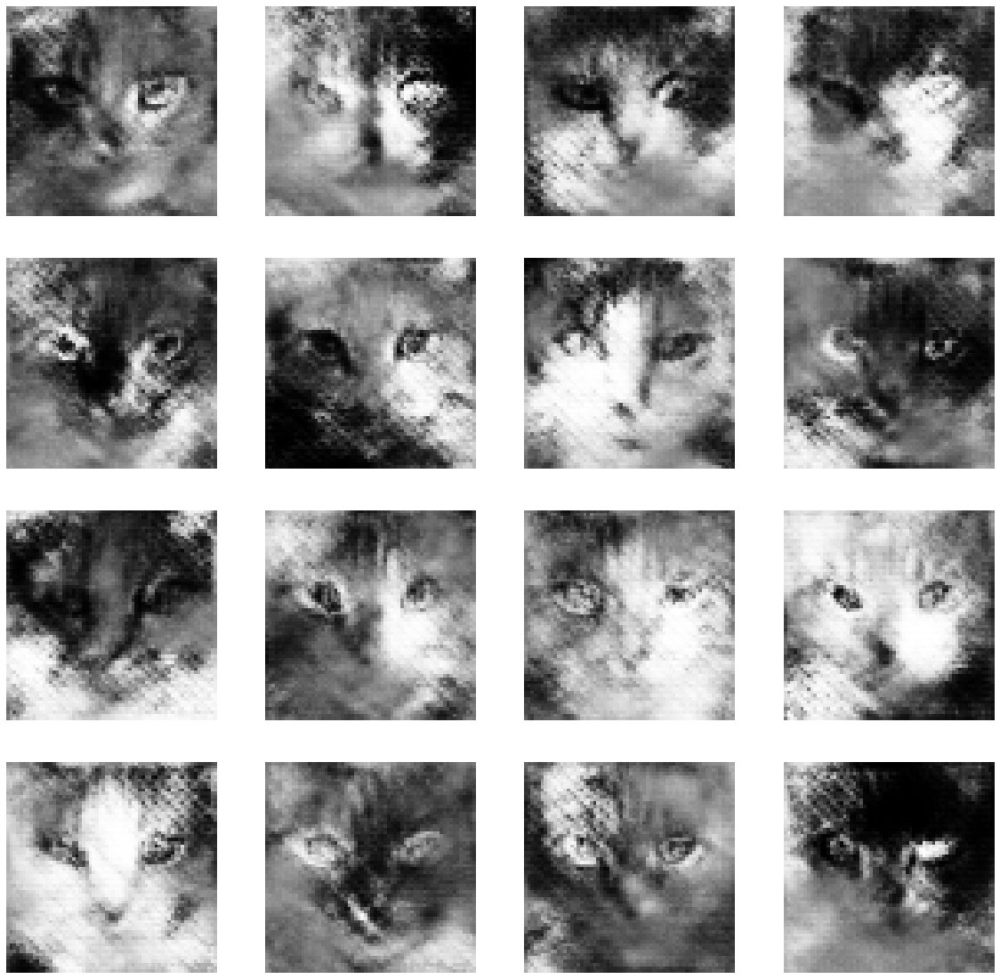

Time for epoch 36 is 63.53701663017273 sec
Epoch 36 batch 20
Epoch 36 batch 40
Epoch 36 batch 60
Epoch 36 batch 80
Epoch 36 batch 100
Epoch 36 batch 120
Epoch 36 batch 140
Epoch 36 batch 160
Epoch 36 batch 180
Epoch 36 batch 200
Epoch 36 batch 220
Epoch 36 batch 240


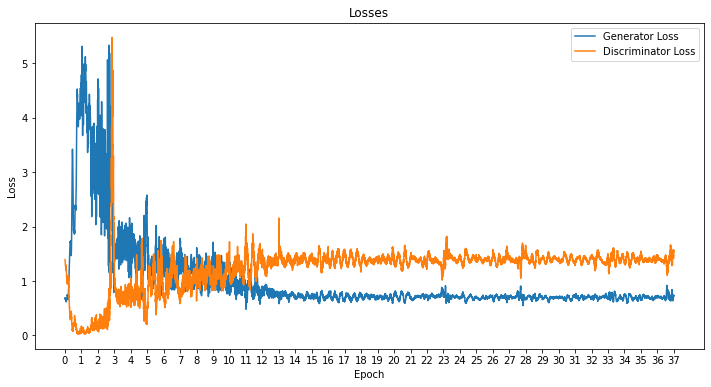

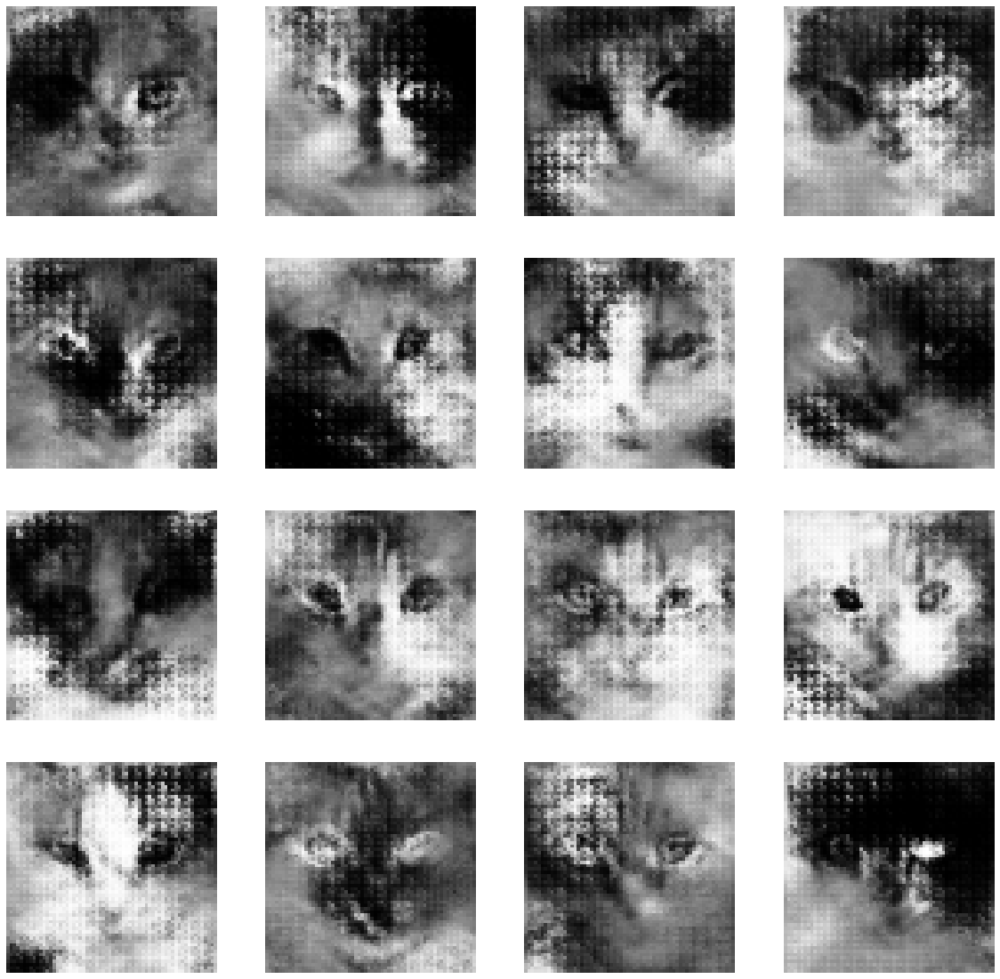

Time for epoch 37 is 59.44089126586914 sec
Epoch 37 batch 20
Epoch 37 batch 40
Epoch 37 batch 60
Epoch 37 batch 80
Epoch 37 batch 100
Epoch 37 batch 120
Epoch 37 batch 140
Epoch 37 batch 160
Epoch 37 batch 180
Epoch 37 batch 200
Epoch 37 batch 220
Epoch 37 batch 240


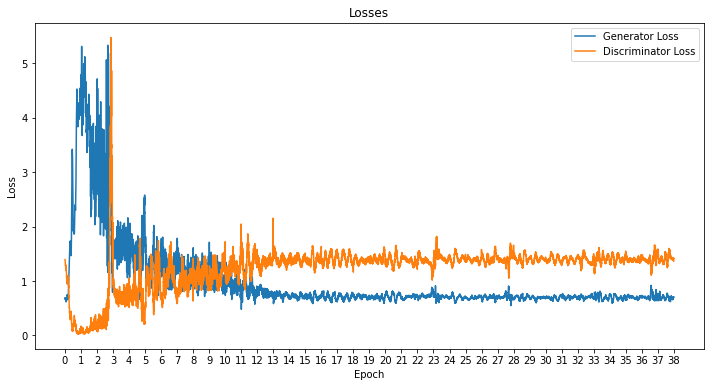

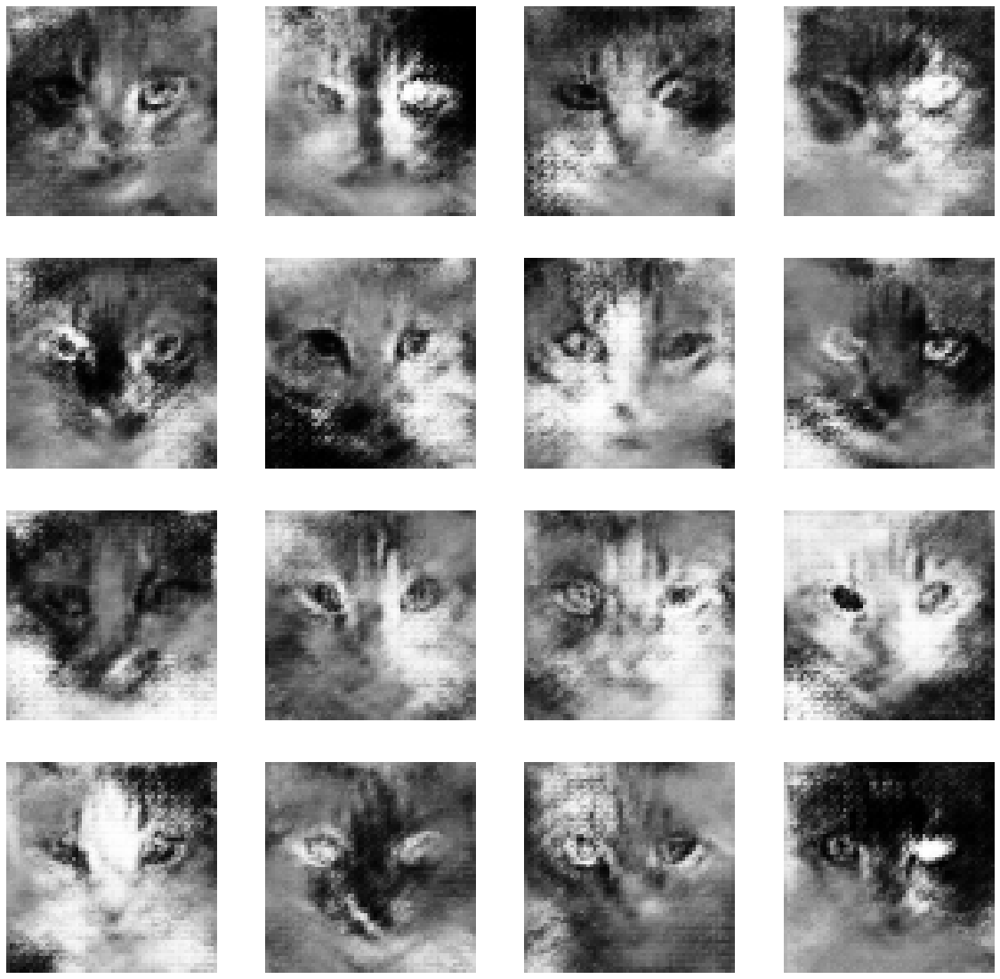

Time for epoch 38 is 67.80938005447388 sec
Epoch 38 batch 20
Epoch 38 batch 40
Epoch 38 batch 60
Epoch 38 batch 80
Epoch 38 batch 100
Epoch 38 batch 120
Epoch 38 batch 140
Epoch 38 batch 160
Epoch 38 batch 180
Epoch 38 batch 200
Epoch 38 batch 220
Epoch 38 batch 240


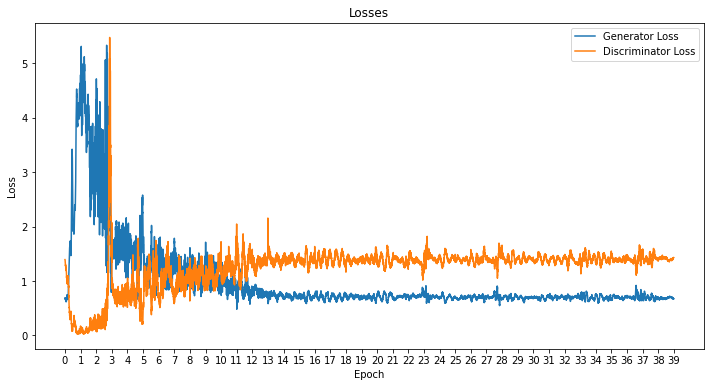

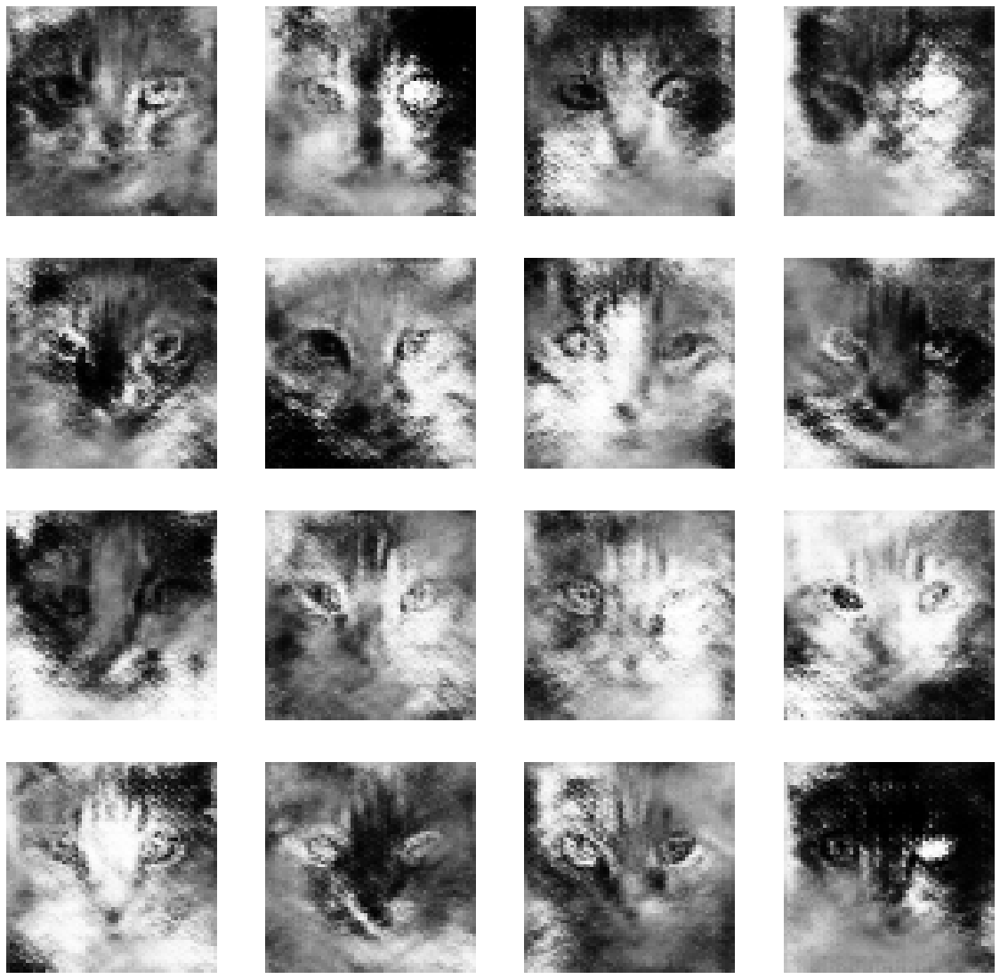

Time for epoch 39 is 67.09123659133911 sec
Epoch 39 batch 20
Epoch 39 batch 40
Epoch 39 batch 60
Epoch 39 batch 80
Epoch 39 batch 100
Epoch 39 batch 120
Epoch 39 batch 140
Epoch 39 batch 160
Epoch 39 batch 180
Epoch 39 batch 200
Epoch 39 batch 220
Epoch 39 batch 240


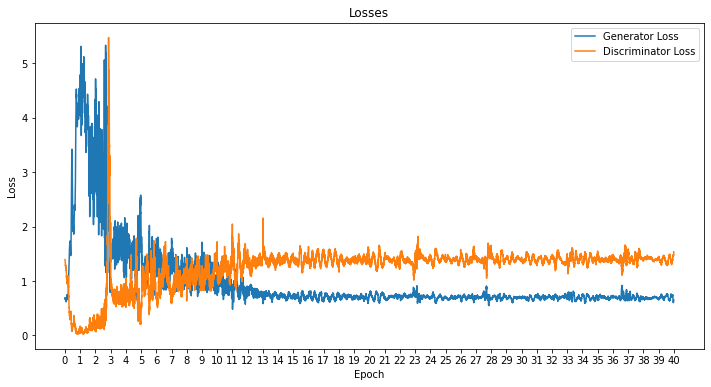

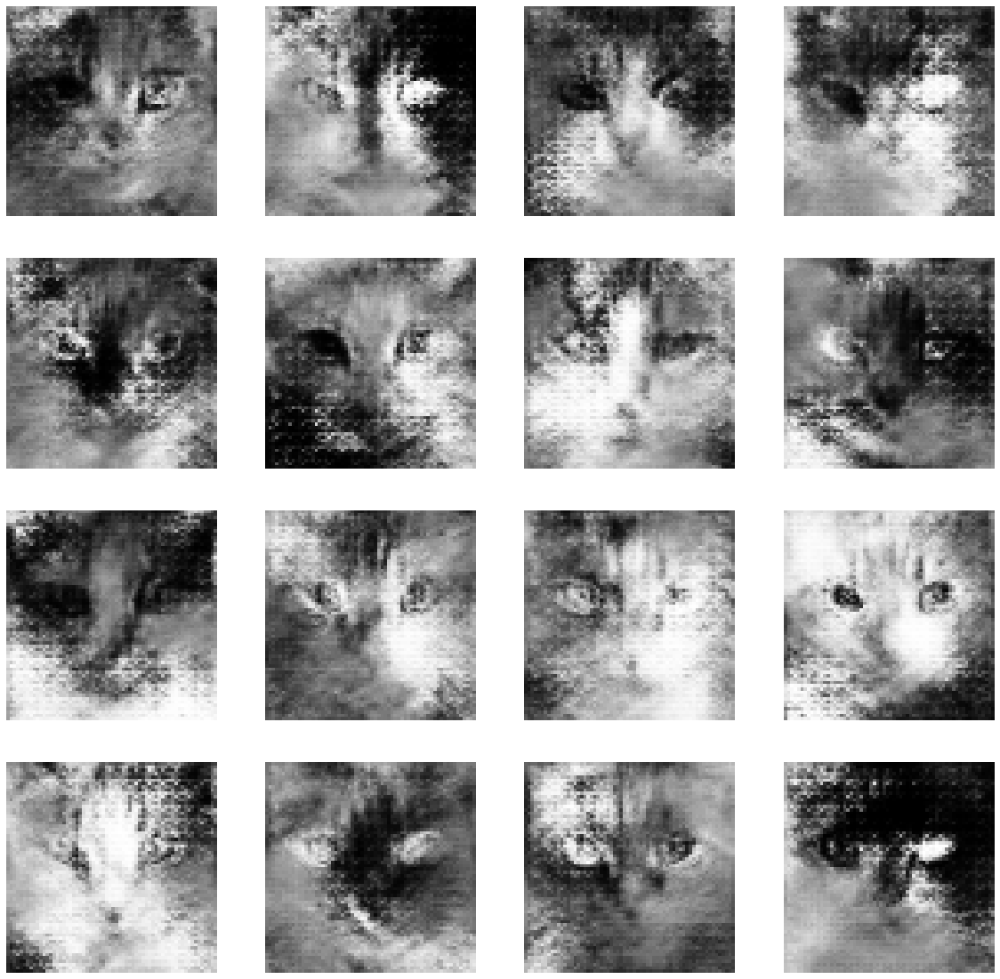

Time for epoch 40 is 68.62893104553223 sec
Epoch 40 batch 20
Epoch 40 batch 40
Epoch 40 batch 60
Epoch 40 batch 80
Epoch 40 batch 100
Epoch 40 batch 120
Epoch 40 batch 140
Epoch 40 batch 160
Epoch 40 batch 180
Epoch 40 batch 200
Epoch 40 batch 220
Epoch 40 batch 240


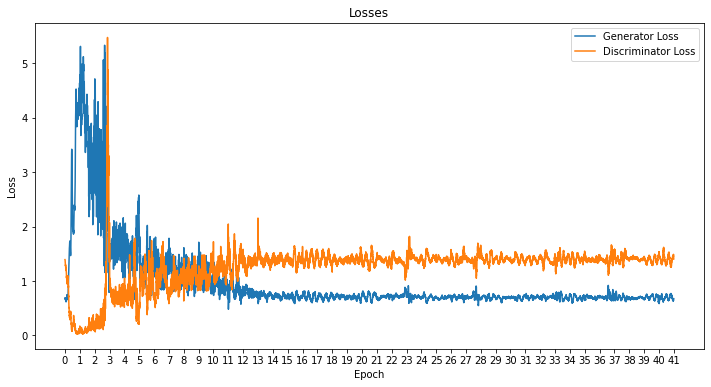

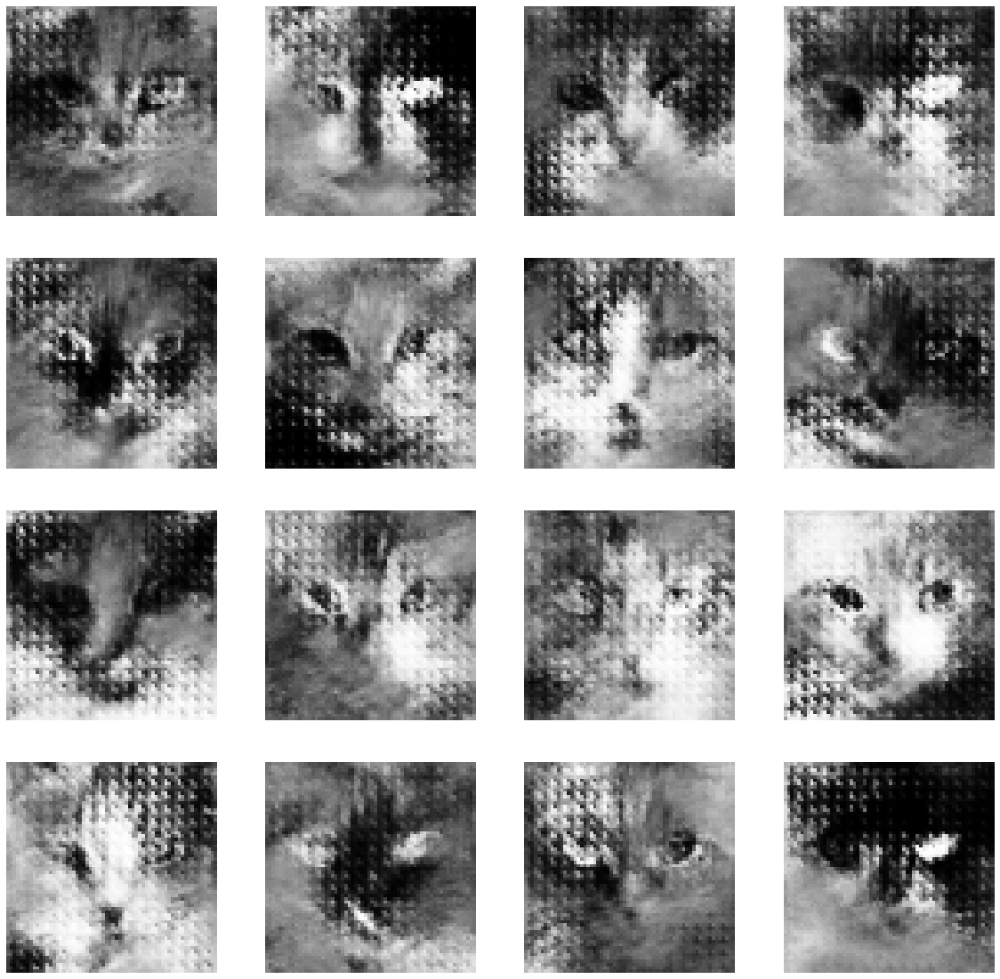

Time for epoch 41 is 68.32368445396423 sec
Epoch 41 batch 20
Epoch 41 batch 40
Epoch 41 batch 60
Epoch 41 batch 80
Epoch 41 batch 100
Epoch 41 batch 120
Epoch 41 batch 140
Epoch 41 batch 160
Epoch 41 batch 180
Epoch 41 batch 200
Epoch 41 batch 220
Epoch 41 batch 240


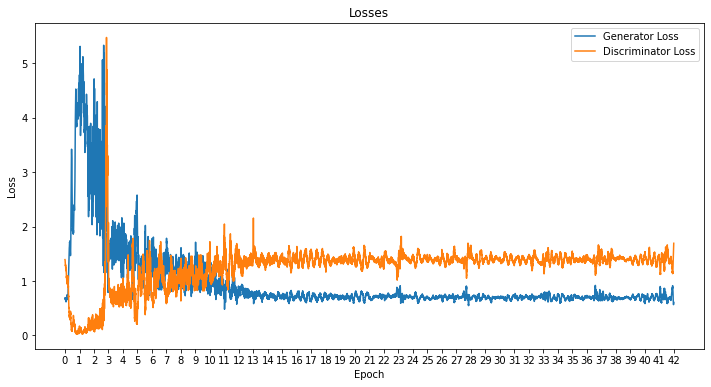

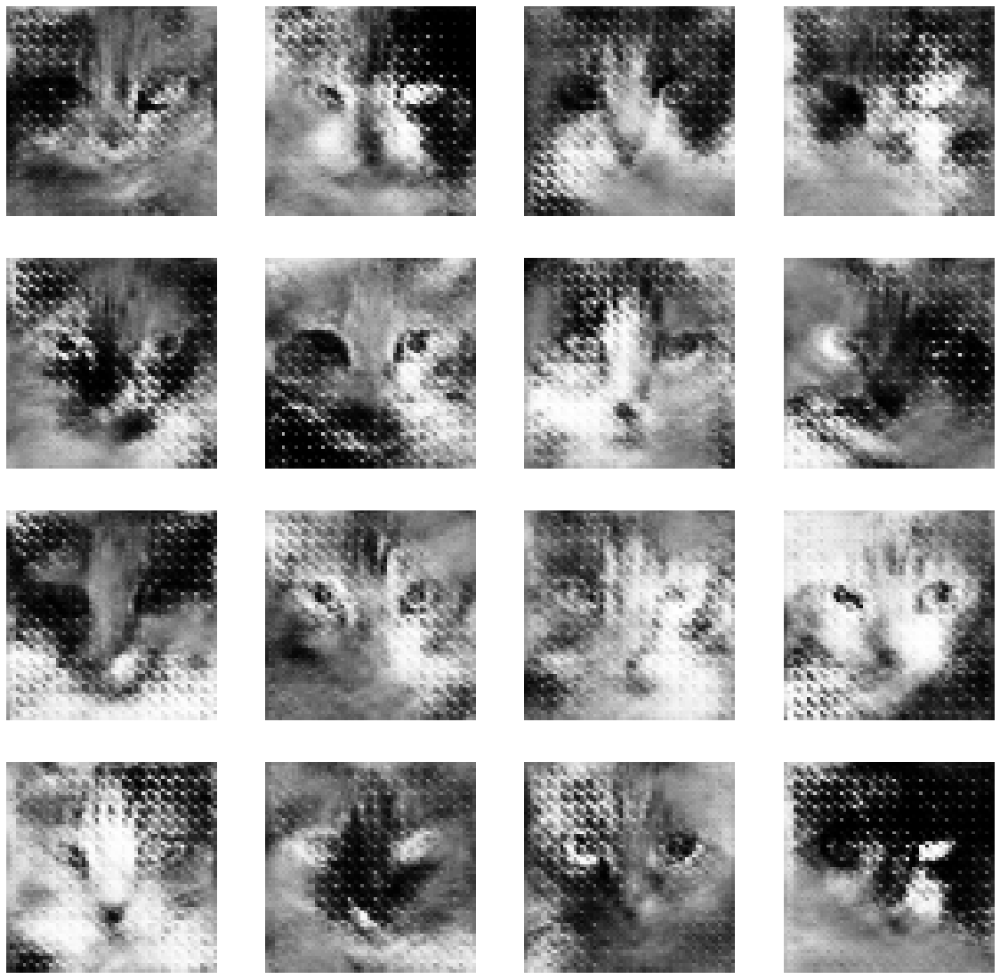

Time for epoch 42 is 60.33255863189697 sec
Epoch 42 batch 20
Epoch 42 batch 40
Epoch 42 batch 60
Epoch 42 batch 80
Epoch 42 batch 100
Epoch 42 batch 120
Epoch 42 batch 140
Epoch 42 batch 160
Epoch 42 batch 180
Epoch 42 batch 200
Epoch 42 batch 220
Epoch 42 batch 240


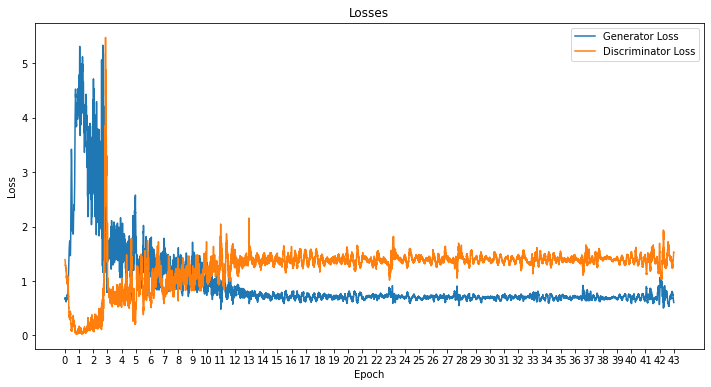

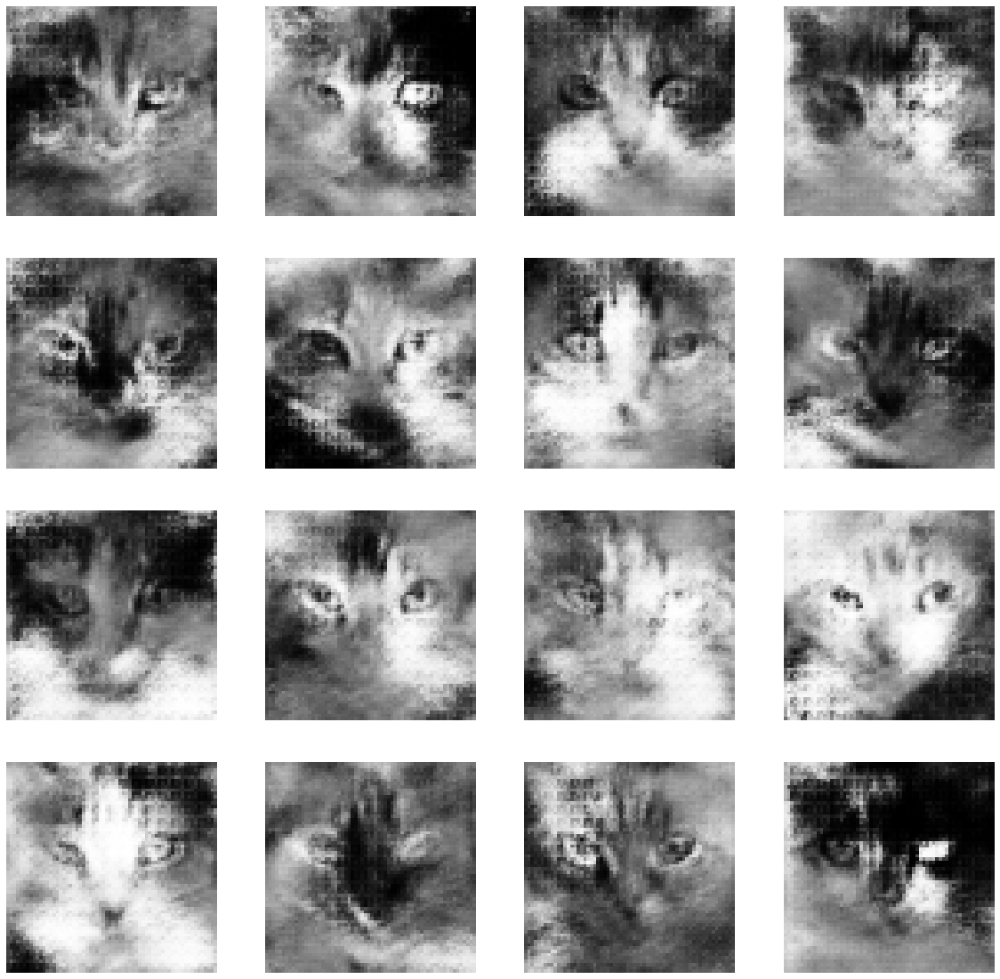

Time for epoch 43 is 69.8301932811737 sec
Epoch 43 batch 20
Epoch 43 batch 40
Epoch 43 batch 60
Epoch 43 batch 80
Epoch 43 batch 100
Epoch 43 batch 120
Epoch 43 batch 140
Epoch 43 batch 160
Epoch 43 batch 180
Epoch 43 batch 200
Epoch 43 batch 220
Epoch 43 batch 240


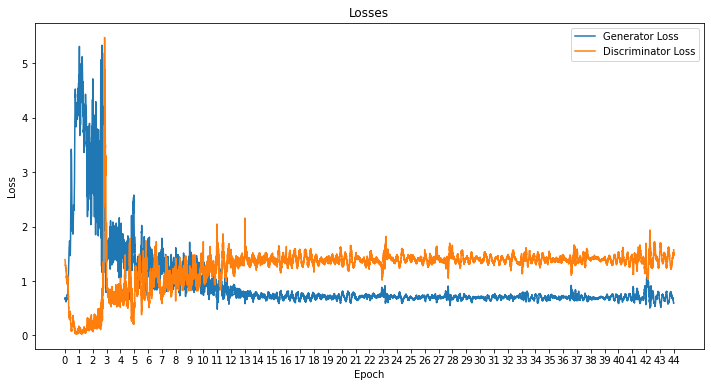

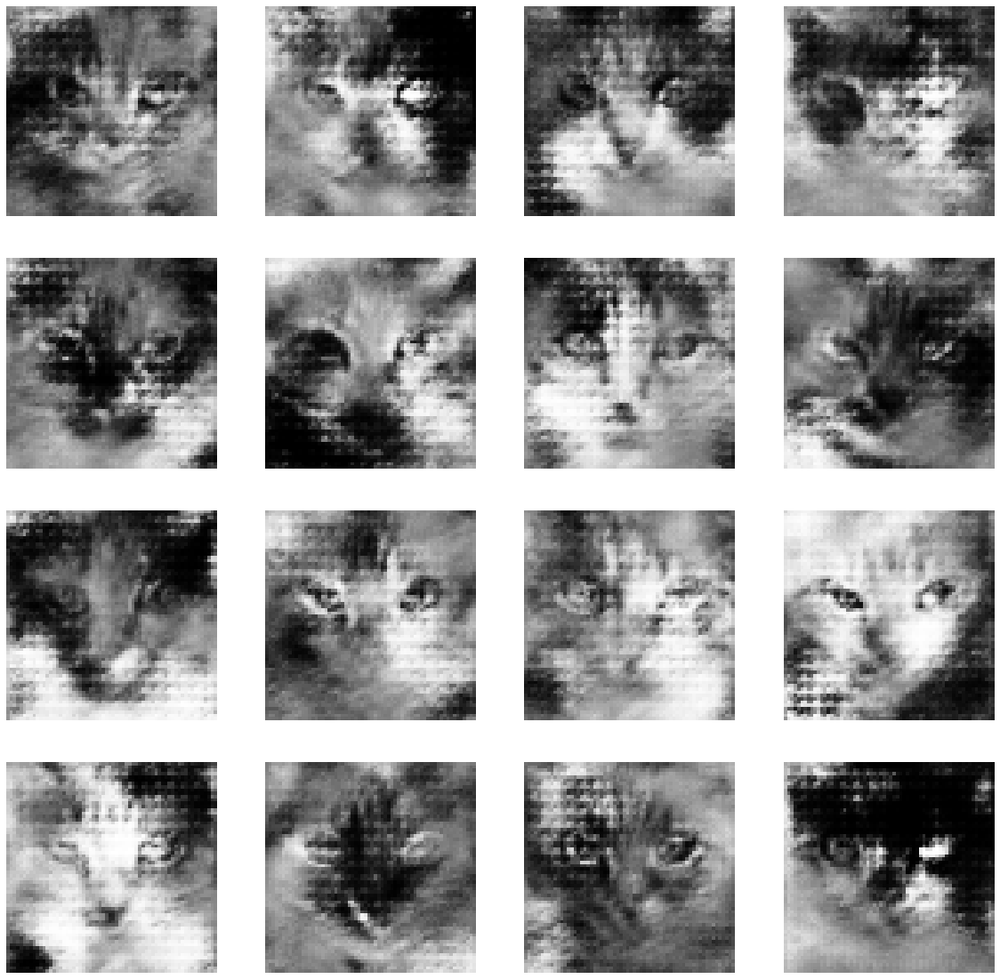

Time for epoch 44 is 74.37738752365112 sec
Epoch 44 batch 20
Epoch 44 batch 40
Epoch 44 batch 60
Epoch 44 batch 80
Epoch 44 batch 100
Epoch 44 batch 120
Epoch 44 batch 140
Epoch 44 batch 160
Epoch 44 batch 180
Epoch 44 batch 200
Epoch 44 batch 220
Epoch 44 batch 240


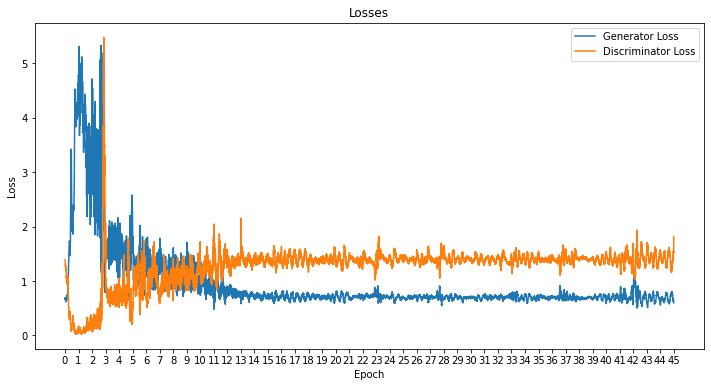

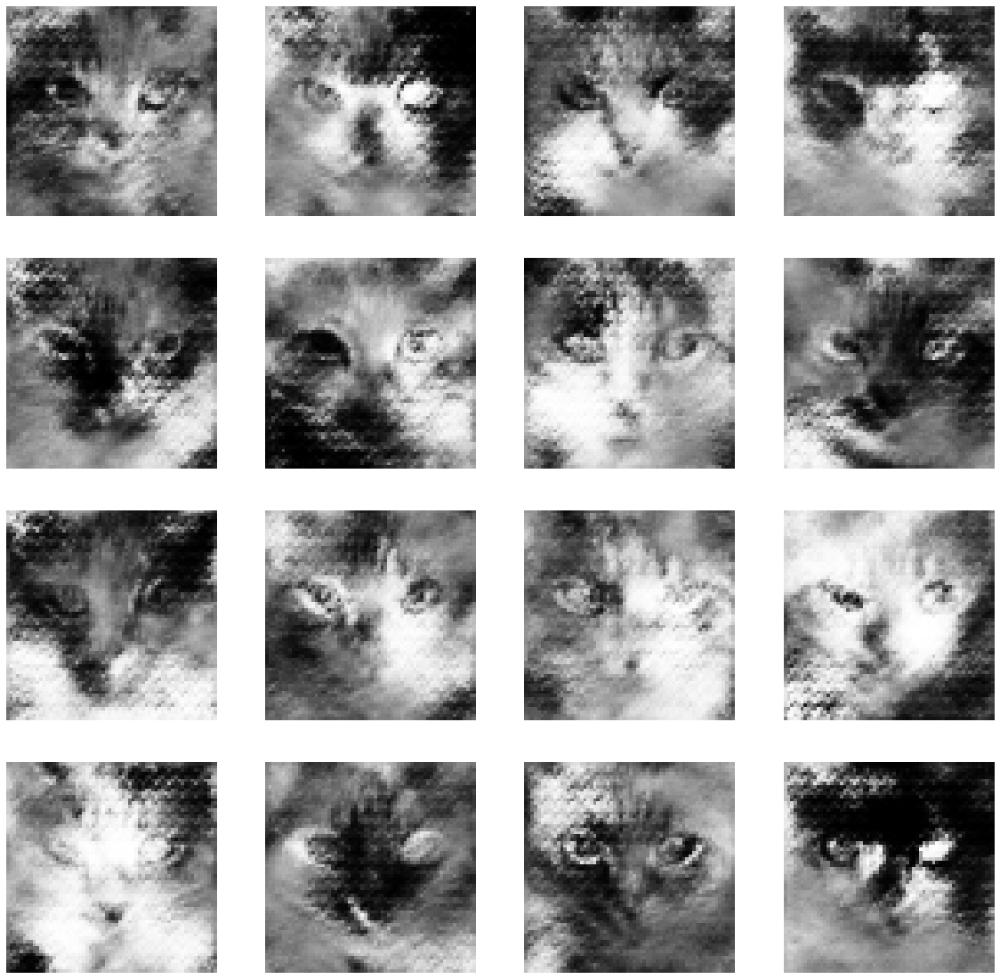

Time for epoch 45 is 71.4610652923584 sec
Epoch 45 batch 20
Epoch 45 batch 40
Epoch 45 batch 60
Epoch 45 batch 80
Epoch 45 batch 100
Epoch 45 batch 120
Epoch 45 batch 140
Epoch 45 batch 160
Epoch 45 batch 180
Epoch 45 batch 200
Epoch 45 batch 220
Epoch 45 batch 240


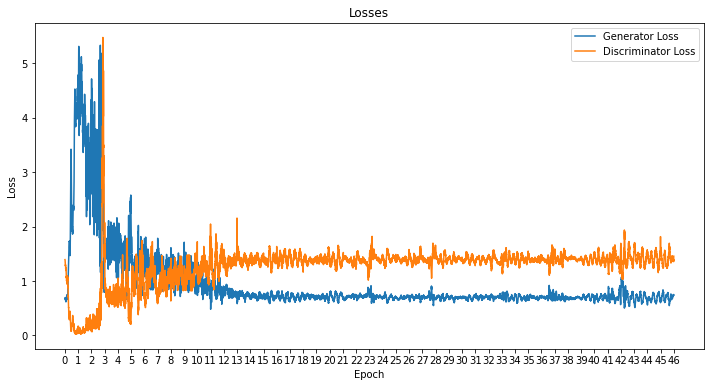

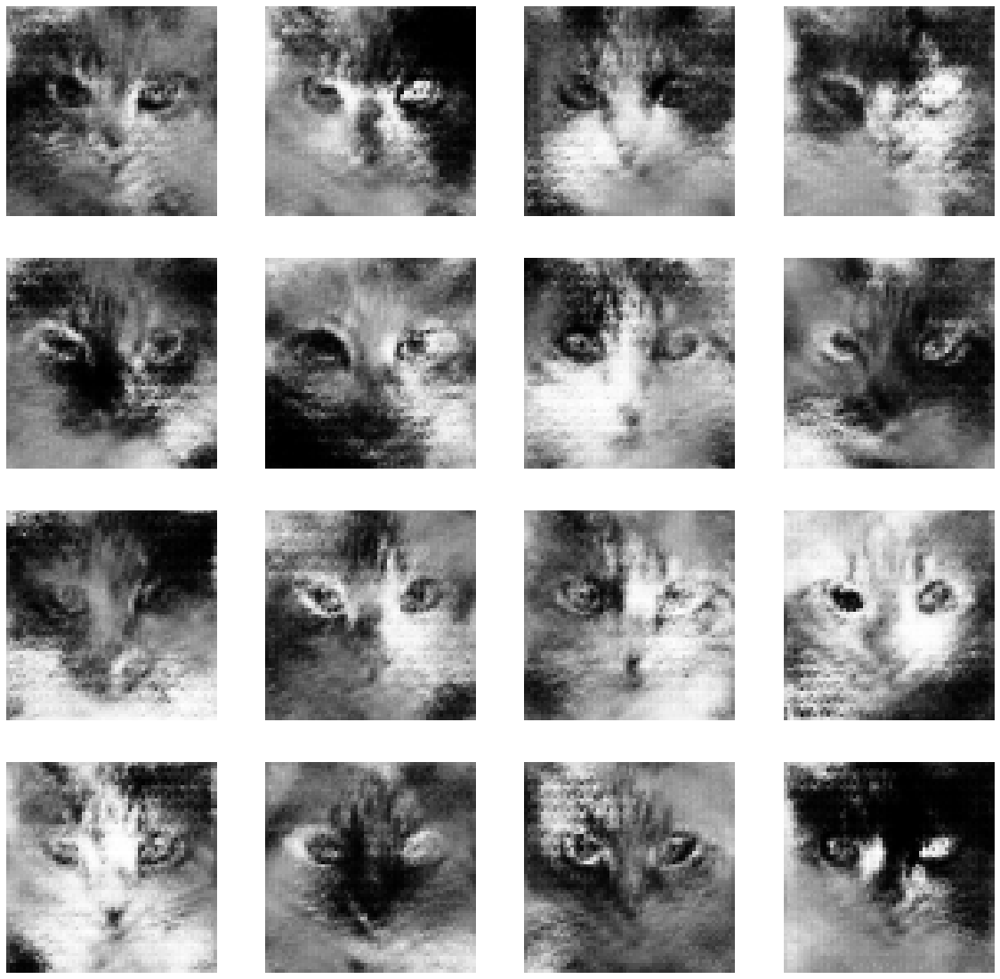

Time for epoch 46 is 69.37098431587219 sec
Epoch 46 batch 20
Epoch 46 batch 40
Epoch 46 batch 60
Epoch 46 batch 80
Epoch 46 batch 100
Epoch 46 batch 120
Epoch 46 batch 140
Epoch 46 batch 160
Epoch 46 batch 180
Epoch 46 batch 200
Epoch 46 batch 220
Epoch 46 batch 240


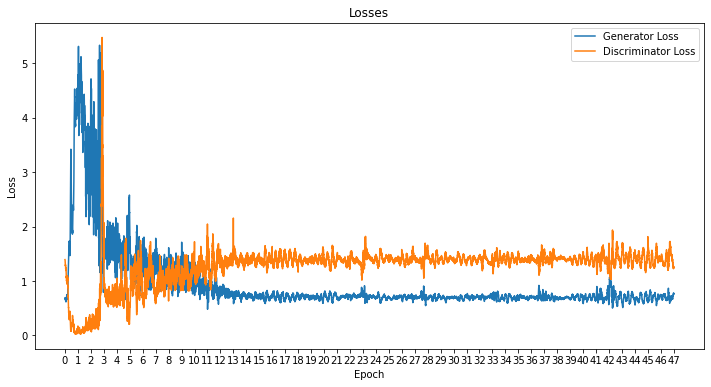

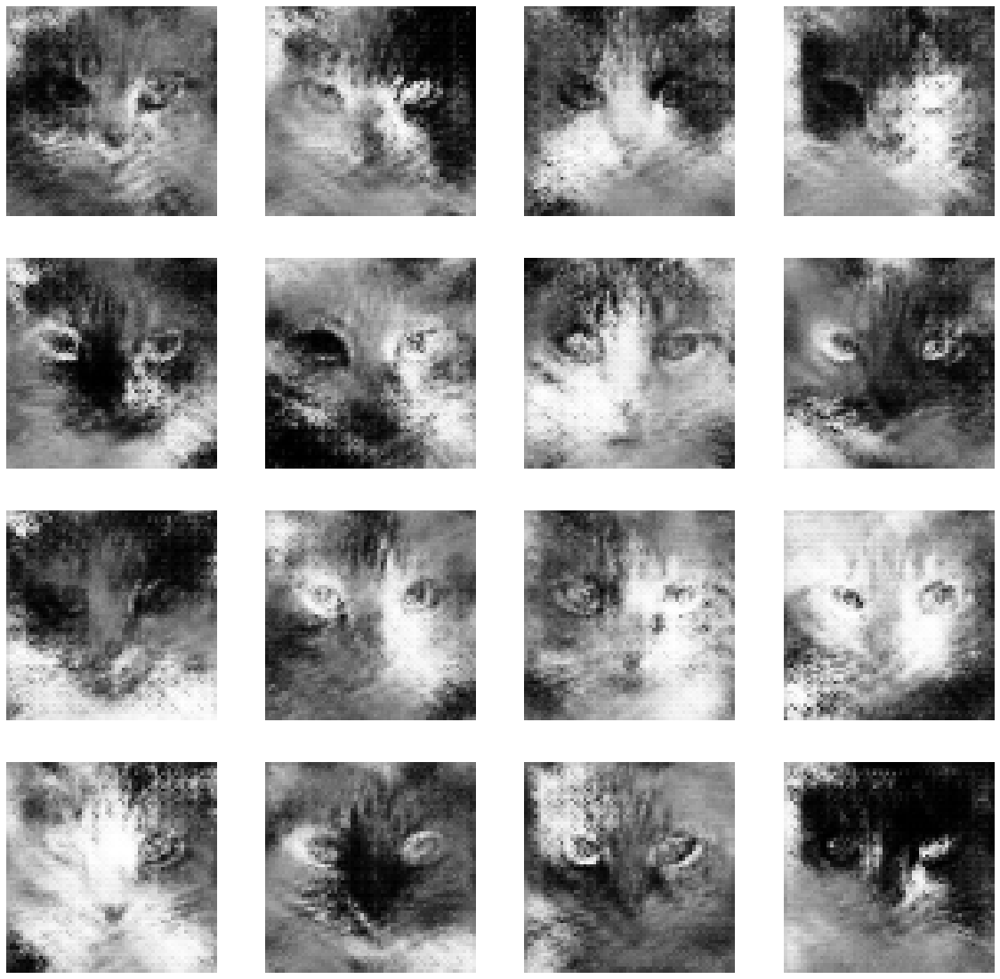

Time for epoch 47 is 67.16886496543884 sec
Epoch 47 batch 20
Epoch 47 batch 40
Epoch 47 batch 60
Epoch 47 batch 80
Epoch 47 batch 100
Epoch 47 batch 120
Epoch 47 batch 140
Epoch 47 batch 160
Epoch 47 batch 180
Epoch 47 batch 200
Epoch 47 batch 220
Epoch 47 batch 240


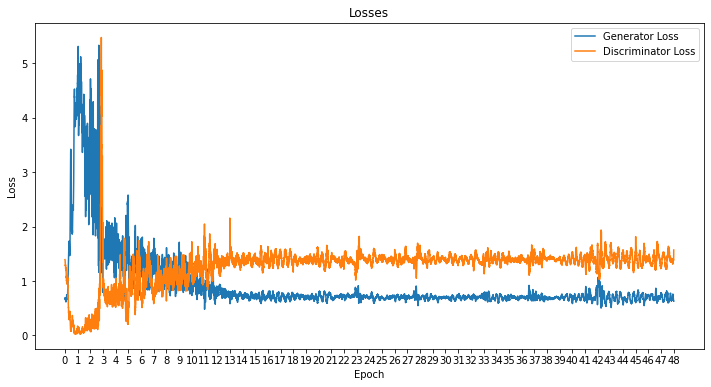

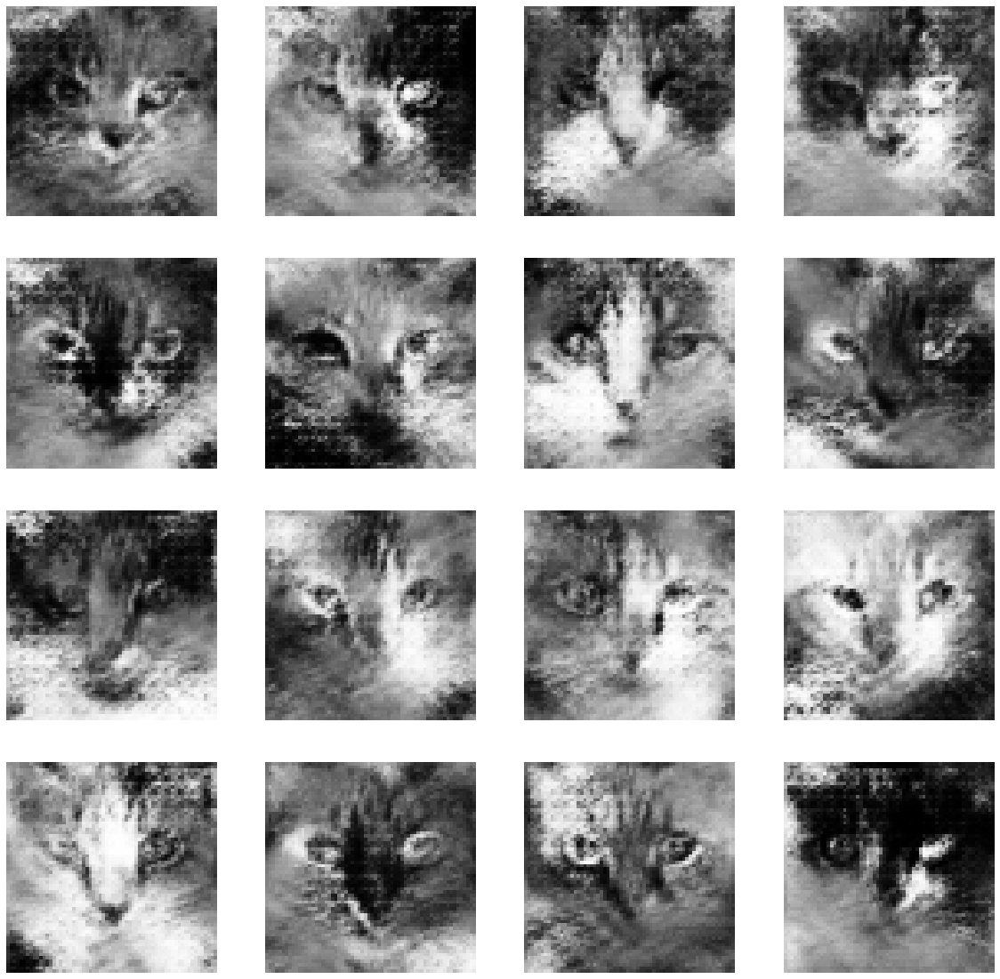

Time for epoch 48 is 62.636801958084106 sec
Epoch 48 batch 20
Epoch 48 batch 40
Epoch 48 batch 60
Epoch 48 batch 80
Epoch 48 batch 100
Epoch 48 batch 120
Epoch 48 batch 140
Epoch 48 batch 160
Epoch 48 batch 180
Epoch 48 batch 200
Epoch 48 batch 220
Epoch 48 batch 240


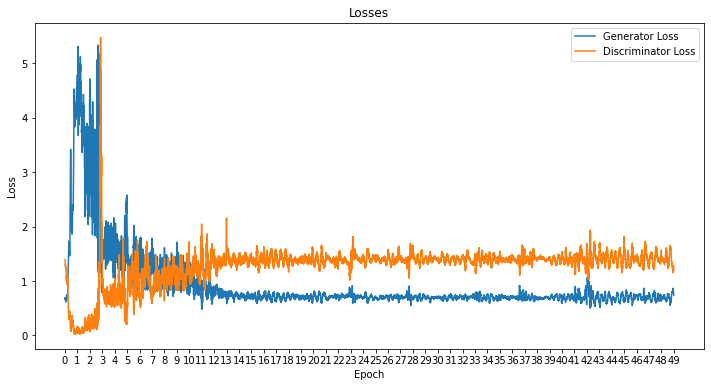

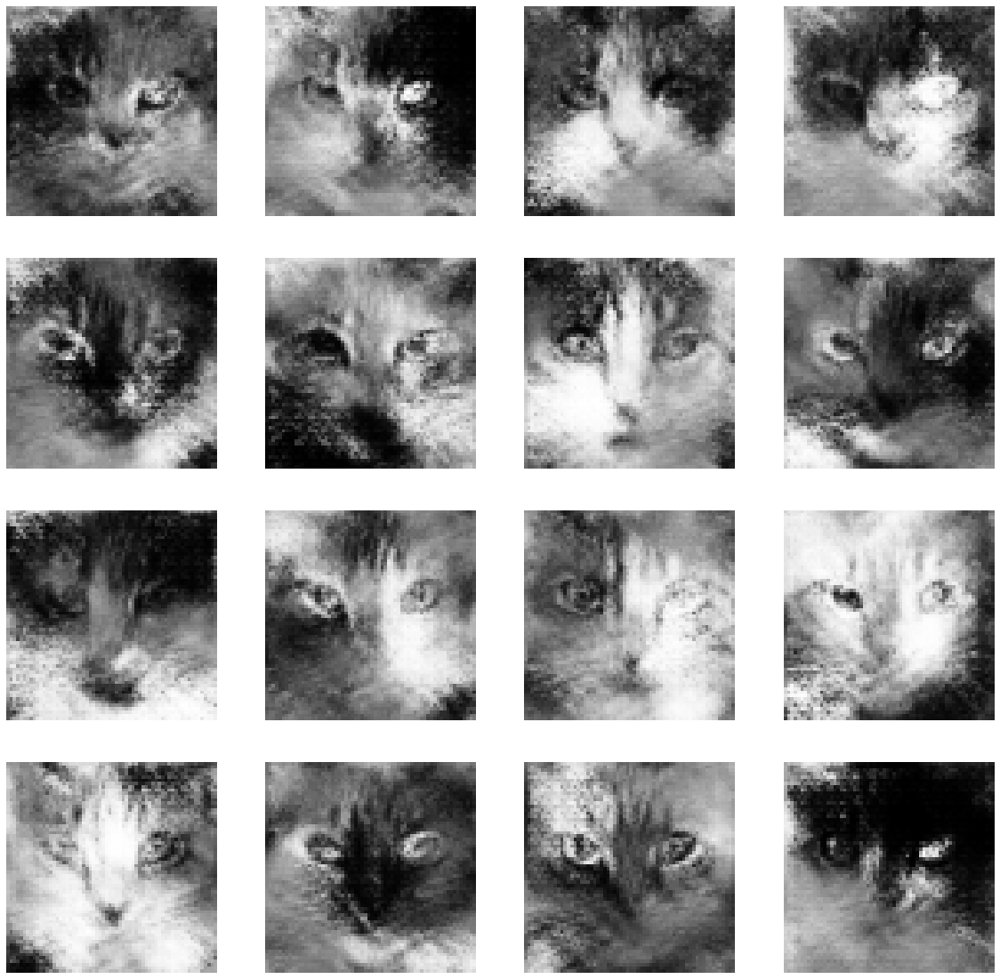

Time for epoch 49 is 71.35569977760315 sec
Epoch 49 batch 20
Epoch 49 batch 40
Epoch 49 batch 60
Epoch 49 batch 80
Epoch 49 batch 100
Epoch 49 batch 120
Epoch 49 batch 140
Epoch 49 batch 160
Epoch 49 batch 180
Epoch 49 batch 200
Epoch 49 batch 220
Epoch 49 batch 240


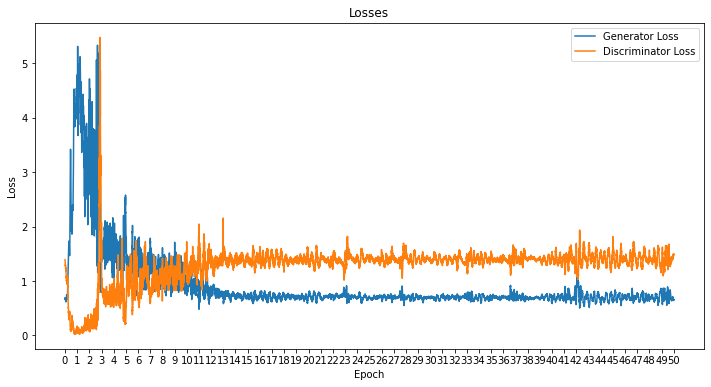

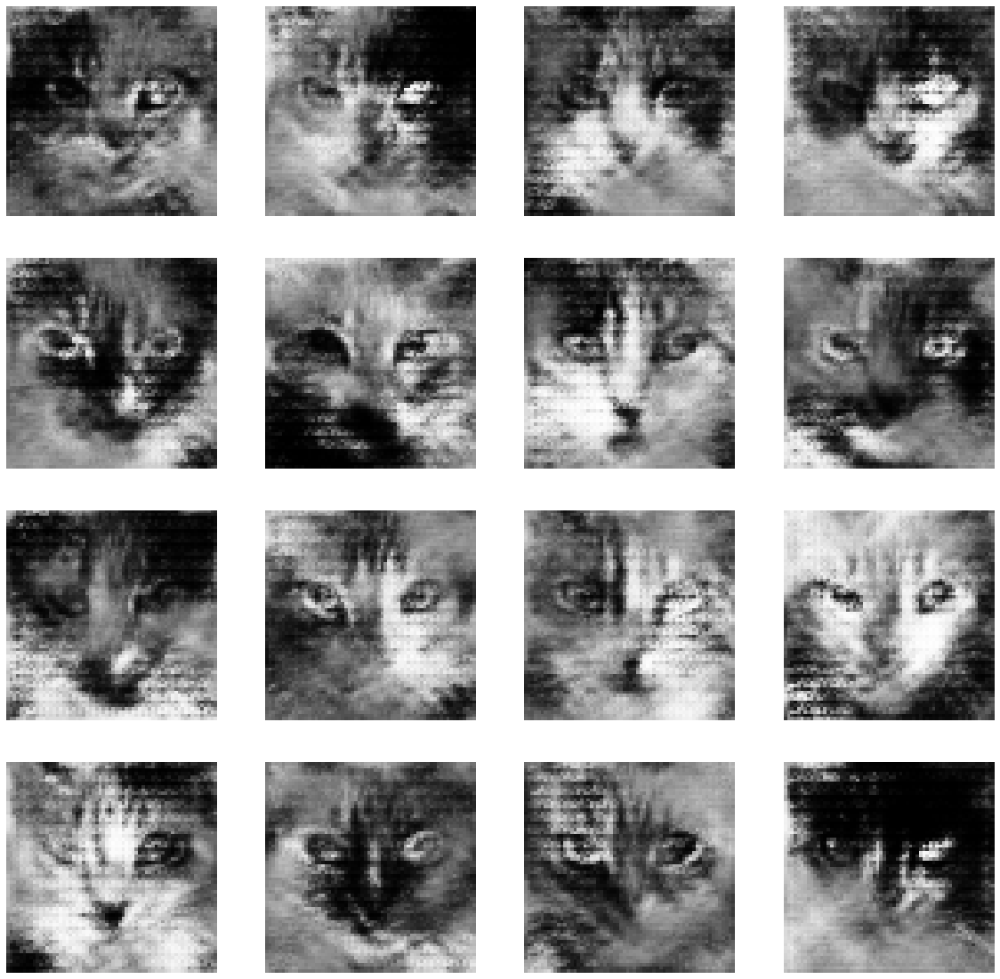

Time for epoch 50 is 72.15238618850708 sec


NameError: name 'all_gen_losses' is not defined

In [16]:
all_gen_losses, all_disc_losses = train(train_dataset, EPOCHS)